In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import time

In [2]:
!pip install kaggle

In [ ]:
!kaggle datasets download -d obulisainaren/multi-cancer

In [1]:
%ls

MobileNet_V1.ipynb  multi-cancer.zip


In [2]:
!unzip multi-cancer.zip

Archive:  multi-cancer.zip
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0001.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0002.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0003.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0004.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0005.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0006.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0007.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0008.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0009.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0010.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0011.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0012.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_ben

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0209.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0210.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0211.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0212.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0213.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0214.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0215.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0216.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0217.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0218.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0219.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0220.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0221.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0394.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0395.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0396.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0397.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0398.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0399.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0400.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0401.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0402.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0403.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0404.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0405.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0406.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0603.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0604.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0605.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0606.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0607.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0608.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0609.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0610.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0611.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0612.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0613.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0614.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0615.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0810.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0811.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0812.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0813.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0814.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0815.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0816.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0817.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0818.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0819.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0820.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0821.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_0822.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1014.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1015.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1016.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1017.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1018.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1019.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1020.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1021.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1022.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1023.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1024.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1025.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1026.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1199.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1200.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1201.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1202.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1203.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1204.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1205.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1206.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1207.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1208.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1209.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1210.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1211.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1392.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1393.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1394.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1395.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1396.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1397.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1398.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1399.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1400.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1401.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1402.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1403.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1404.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1532.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1533.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1534.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1535.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1536.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1537.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1538.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1539.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1540.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1541.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1542.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1543.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1544.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1723.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1724.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1725.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1726.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1727.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1728.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1729.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1730.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1731.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1732.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1733.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1734.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1735.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1869.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1870.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1871.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1872.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1873.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1874.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1875.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1876.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1877.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1878.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1879.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1880.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_1881.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2065.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2066.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2067.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2068.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2069.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2070.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2071.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2072.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2073.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2074.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2075.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2076.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2077.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2267.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2268.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2269.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2270.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2271.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2272.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2273.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2274.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2275.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2276.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2277.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2278.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2279.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2520.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2521.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2522.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2523.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2524.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2525.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2526.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2527.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2528.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2529.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2530.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2531.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2532.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2679.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2680.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2681.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2682.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2683.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2684.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2685.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2686.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2687.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2688.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2689.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2690.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2691.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2832.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2833.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2834.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2835.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2836.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2837.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2838.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2839.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2840.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2841.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2842.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2843.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2844.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2993.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2994.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2995.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2996.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2997.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2998.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_2999.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3000.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3001.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3002.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3003.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3004.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3005.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3146.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3147.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3148.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3149.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3150.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3151.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3152.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3153.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3154.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3155.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3156.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3157.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3158.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3303.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3304.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3305.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3306.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3307.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3308.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3309.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3310.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3311.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3312.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3313.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3314.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3315.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3412.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3413.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3414.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3415.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3416.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3417.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3418.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3419.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3420.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3421.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3422.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3423.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3424.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3530.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3531.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3532.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3533.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3534.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3535.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3536.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3537.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3538.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3539.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3540.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3541.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3542.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3683.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3684.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3685.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3686.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3687.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3688.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3689.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3690.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3691.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3692.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3693.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3694.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3695.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3823.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3824.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3825.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3826.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3827.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3828.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3829.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3830.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3831.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3832.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3833.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3834.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3835.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3942.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3943.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3944.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3945.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3946.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3947.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3948.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3949.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3950.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3951.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3952.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3953.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_3954.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4106.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4107.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4108.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4109.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4110.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4111.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4112.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4113.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4114.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4115.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4116.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4117.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4118.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4279.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4280.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4281.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4282.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4283.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4284.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4285.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4286.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4287.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4288.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4289.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4290.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4291.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4488.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4489.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4490.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4491.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4492.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4493.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4494.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4495.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4496.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4497.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4498.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4499.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4500.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4673.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4674.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4675.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4676.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4677.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4678.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4679.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4680.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4681.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4682.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4683.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4684.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4685.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4847.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4848.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4849.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4850.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4851.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4852.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4853.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4854.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4855.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4856.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4857.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4858.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4859.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4983.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4984.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4985.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4986.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4987.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4988.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4989.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4990.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4991.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4992.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4993.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4994.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_benign/all_benign_4995.jpg  
  inflating:

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0191.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0192.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0193.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0194.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0195.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0196.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0197.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0198.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0199.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0200.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0201.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0202.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0203.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0314.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0315.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0316.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0317.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0318.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0319.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0320.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0321.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0322.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0323.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0324.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0325.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0326.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0488.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0489.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0490.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0491.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0492.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0493.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0494.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0495.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0496.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0497.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0498.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0499.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0500.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0696.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0697.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0698.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0699.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0700.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0701.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0702.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0703.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0704.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0705.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0706.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0707.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0708.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0903.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0904.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0905.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0906.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0907.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0908.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0909.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0910.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0911.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0912.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0913.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0914.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_0915.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1141.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1142.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1143.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1144.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1145.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1146.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1147.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1148.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1149.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1150.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1151.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1152.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1153.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1347.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1348.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1349.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1350.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1351.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1352.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1353.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1354.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1355.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1356.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1357.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1358.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1359.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1560.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1561.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1562.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1563.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1564.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1565.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1566.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1567.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1568.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1569.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1570.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1571.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1572.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1741.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1742.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1743.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1744.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1745.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1746.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1747.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1748.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1749.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1750.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1751.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1752.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1753.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1983.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1984.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1985.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1986.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1987.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1988.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1989.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1990.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1991.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1992.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1993.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1994.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_1995.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2170.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2171.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2172.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2173.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2174.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2175.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2176.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2177.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2178.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2179.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2180.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2181.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2182.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2387.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2388.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2389.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2390.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2391.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2392.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2393.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2394.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2395.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2396.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2397.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2398.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2399.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2585.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2586.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2587.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2588.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2589.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2590.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2591.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2592.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2593.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2594.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2595.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2596.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2597.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2793.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2794.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2795.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2796.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2797.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2798.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2799.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2800.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2801.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2802.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2803.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2804.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_2805.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3004.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3005.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3006.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3007.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3008.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3009.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3010.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3011.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3012.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3013.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3014.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3015.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3016.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3214.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3215.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3216.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3217.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3218.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3219.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3220.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3221.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3222.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3223.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3224.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3225.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3226.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3423.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3424.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3425.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3426.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3427.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3428.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3429.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3430.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3431.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3432.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3433.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3434.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3435.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3639.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3640.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3641.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3642.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3643.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3644.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3645.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3646.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3647.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3648.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3649.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3650.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3651.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3849.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3850.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3851.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3852.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3853.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3854.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3855.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3856.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3857.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3858.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3859.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3860.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_3861.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4058.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4059.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4060.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4061.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4062.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4063.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4064.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4065.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4066.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4067.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4068.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4069.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4070.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4259.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4260.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4261.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4262.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4263.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4264.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4265.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4266.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4267.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4268.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4269.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4270.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4271.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4458.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4459.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4460.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4461.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4462.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4463.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4464.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4465.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4466.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4467.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4468.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4469.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4470.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4669.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4670.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4671.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4672.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4673.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4674.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4675.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4676.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4677.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4678.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4679.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4680.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4681.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4810.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4811.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4812.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4813.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4814.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4815.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4816.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4817.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4818.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4819.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4820.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4821.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_early/all_early_4822.jpg  
  inflating: Multi Cancer/Multi Cancer

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0006.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0007.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0008.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0009.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0010.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0011.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0012.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0013.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0014.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0015.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0016.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0017.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0018.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0019.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0204.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0205.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0206.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0207.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0208.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0209.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0210.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0211.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0212.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0213.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0214.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0215.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0216.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0217.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0396.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0397.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0398.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0399.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0400.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0401.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0402.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0403.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0404.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0405.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0406.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0407.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0408.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0409.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0566.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0567.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0568.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0569.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0570.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0571.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0572.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0573.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0574.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0575.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0576.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0577.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0578.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0579.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0720.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0721.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0722.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0723.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0724.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0725.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0726.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0727.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0728.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0729.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0730.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0731.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0732.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0733.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0840.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0841.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0842.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0843.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0844.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0845.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0846.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0847.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0848.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0849.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0850.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0851.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0852.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_0853.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1039.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1040.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1041.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1042.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1043.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1044.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1045.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1046.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1047.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1048.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1049.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1050.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1051.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1052.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1237.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1238.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1239.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1240.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1241.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1242.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1243.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1244.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1245.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1246.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1247.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1248.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1249.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1250.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1433.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1434.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1435.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1436.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1437.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1438.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1439.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1440.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1441.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1442.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1443.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1444.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1445.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1446.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1615.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1616.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1617.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1618.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1619.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1620.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1621.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1622.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1623.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1624.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1625.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1626.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1627.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1628.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1808.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1809.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1810.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1811.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1812.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1813.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1814.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1815.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1816.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1817.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1818.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1819.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1820.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_1821.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2003.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2004.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2005.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2006.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2007.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2008.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2009.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2010.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2011.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2012.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2013.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2014.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2015.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2016.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2163.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2164.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2165.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2166.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2167.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2168.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2169.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2170.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2171.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2172.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2173.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2174.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2175.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2176.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2341.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2342.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2343.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2344.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2345.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2346.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2347.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2348.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2349.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2350.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2351.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2352.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2353.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2354.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2538.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2539.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2540.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2541.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2542.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2543.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2544.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2545.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2546.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2547.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2548.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2549.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2550.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2551.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2735.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2736.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2737.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2738.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2739.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2740.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2741.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2742.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2743.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2744.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2745.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2746.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2747.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2748.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2855.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2856.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2857.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2858.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2859.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2860.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2861.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2862.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2863.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2864.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2865.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2866.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2867.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2868.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2987.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2988.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2989.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2990.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2991.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2992.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2993.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2994.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2995.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2996.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2997.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2998.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_2999.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3000.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3191.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3192.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3193.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3194.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3195.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3196.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3197.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3198.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3199.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3200.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3201.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3202.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3203.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3204.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3412.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3413.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3414.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3415.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3416.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3417.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3418.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3419.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3420.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3421.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3422.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3423.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3424.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3425.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3577.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3578.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3579.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3580.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3581.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3582.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3583.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3584.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3585.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3586.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3587.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3588.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3589.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3590.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3706.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3707.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3708.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3709.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3710.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3711.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3712.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3713.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3714.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3715.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3716.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3717.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3718.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3719.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3911.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3912.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3913.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3914.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3915.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3916.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3917.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3918.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3919.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3920.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3921.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3922.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3923.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_3924.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4048.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4049.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4050.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4051.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4052.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4053.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4054.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4055.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4056.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4057.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4058.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4059.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4060.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4061.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4314.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4315.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4316.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4317.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4318.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4319.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4320.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4321.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4322.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4323.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4324.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4325.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4326.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4327.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4504.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4505.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4506.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4507.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4508.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4509.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4510.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4511.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4512.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4513.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4514.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4515.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4516.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4517.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4630.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4631.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4632.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4633.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4634.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4635.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4636.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4637.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4638.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4639.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4640.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4641.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4642.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4643.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4791.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4792.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4793.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4794.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4795.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4796.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4797.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4798.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4799.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4800.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4801.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4802.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4803.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4804.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4983.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4984.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4985.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4986.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4987.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4988.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4989.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4990.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4991.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4992.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4993.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4994.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4995.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pre/all_pre_4996.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0277.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0278.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0279.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0280.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0281.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0282.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0283.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0284.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0285.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0286.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0287.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0288.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0289.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0290.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0473.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0474.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0475.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0476.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0477.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0478.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0479.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0480.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0481.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0482.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0483.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0484.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0485.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0486.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0671.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0672.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0673.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0674.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0675.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0676.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0677.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0678.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0679.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0680.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0681.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0682.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0683.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0684.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0854.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0855.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0856.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0857.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0858.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0859.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0860.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0861.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0862.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0863.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0864.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0865.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0866.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_0867.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1072.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1073.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1074.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1075.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1076.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1077.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1078.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1079.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1080.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1081.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1082.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1083.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1084.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1085.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1278.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1279.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1280.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1281.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1282.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1283.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1284.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1285.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1286.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1287.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1288.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1289.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1290.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1291.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1448.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1449.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1450.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1451.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1452.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1453.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1454.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1455.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1456.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1457.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1458.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1459.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1460.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1461.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1666.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1667.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1668.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1669.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1670.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1671.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1672.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1673.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1674.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1675.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1676.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1677.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1678.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1679.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1891.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1892.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1893.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1894.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1895.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1896.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1897.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1898.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1899.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1900.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1901.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1902.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1903.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_1904.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2112.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2113.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2114.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2115.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2116.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2117.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2118.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2119.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2120.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2121.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2122.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2123.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2124.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2125.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2316.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2317.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2318.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2319.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2320.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2321.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2322.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2323.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2324.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2325.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2326.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2327.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2328.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2329.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2533.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2534.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2535.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2536.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2537.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2538.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2539.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2540.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2541.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2542.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2543.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2544.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2545.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2546.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2724.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2725.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2726.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2727.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2728.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2729.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2730.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2731.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2732.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2733.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2734.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2735.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2736.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2737.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2958.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2959.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2960.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2961.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2962.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2963.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2964.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2965.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2966.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2967.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2968.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2969.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2970.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_2971.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3149.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3150.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3151.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3152.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3153.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3154.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3155.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3156.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3157.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3158.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3159.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3160.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3161.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3162.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3374.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3375.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3376.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3377.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3378.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3379.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3380.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3381.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3382.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3383.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3384.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3385.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3386.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3387.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3589.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3590.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3591.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3592.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3593.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3594.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3595.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3596.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3597.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3598.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3599.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3600.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3601.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3602.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3821.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3822.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3823.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3824.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3825.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3826.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3827.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3828.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3829.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3830.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3831.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3832.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3833.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_3834.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4052.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4053.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4054.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4055.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4056.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4057.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4058.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4059.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4060.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4061.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4062.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4063.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4064.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4065.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4282.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4283.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4284.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4285.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4286.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4287.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4288.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4289.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4290.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4291.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4292.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4293.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4294.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4295.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4513.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4514.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4515.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4516.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4517.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4518.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4519.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4520.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4521.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4522.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4523.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4524.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4525.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4526.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4724.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4725.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4726.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4727.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4728.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4729.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4730.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4731.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4732.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4733.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4734.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4735.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4736.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4737.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4965.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4966.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4967.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4968.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4969.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4970.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4971.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4972.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4973.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4974.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4975.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4976.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4977.jpg  
  inflating: Multi Cancer/Multi Cancer/ALL/all_pro/all_pro_4978.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0256.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0257.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0258.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0259.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0260.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0261.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0262.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0263.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0264.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0265.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0266.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0543.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0544.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0545.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0546.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0547.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0548.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0549.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0550.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0551.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0552.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0553.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0831.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0832.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0833.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0834.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0835.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0836.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0837.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0838.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0839.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0840.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_0841.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1113.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1114.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1115.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1116.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1117.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1118.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1119.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1120.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1121.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1122.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1123.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1356.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1357.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1358.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1359.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1360.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1361.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1362.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1363.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1364.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1365.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1366.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1650.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1651.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1652.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1653.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1654.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1655.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1656.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1657.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1658.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1659.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1660.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1942.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1943.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1944.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1945.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1946.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1947.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1948.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1949.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1950.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1951.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_1952.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2239.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2240.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2241.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2242.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2243.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2244.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2245.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2246.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2247.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2248.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2249.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2531.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2532.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2533.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2534.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2535.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2536.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2537.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2538.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2539.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2540.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2541.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2826.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2827.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2828.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2829.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2830.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2831.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2832.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2833.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2834.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2835.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_2836.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3107.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3108.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3109.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3110.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3111.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3112.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3113.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3114.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3115.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3116.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3117.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3398.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3399.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3400.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3401.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3402.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3403.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3404.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3405.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3406.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3407.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3408.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3694.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3695.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3696.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3697.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3698.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3699.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3700.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3701.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3702.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3703.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3704.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3988.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3989.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3990.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3991.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3992.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3993.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3994.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3995.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3996.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3997.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_3998.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4259.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4260.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4261.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4262.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4263.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4264.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4265.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4266.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4267.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4268.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4269.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4504.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4505.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4506.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4507.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4508.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4509.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4510.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4511.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4512.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4513.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4514.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4690.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4691.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4692.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4693.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4694.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4695.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4696.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4697.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4698.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4699.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4700.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4957.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4958.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4959.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4960.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4961.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4962.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4963.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4964.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4965.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4966.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma/brain_glioma_4967.jpg  
  inflating: Multi Ca

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0178.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0179.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0180.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0181.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0182.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0183.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0184.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0185.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0186.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0187.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0188.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0434.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0435.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0436.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0437.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0438.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0439.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0440.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0441.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0442.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0443.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0444.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0692.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0693.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0694.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0695.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0696.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0697.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0698.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0699.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0700.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0701.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0702.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0900.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0901.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0902.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0903.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0904.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0905.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0906.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0907.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0908.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0909.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_0910.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1114.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1115.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1116.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1117.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1118.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1119.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1120.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1121.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1122.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1123.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1124.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1334.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1335.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1336.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1337.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1338.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1339.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1340.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1341.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1342.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1343.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1344.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1583.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1584.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1585.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1586.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1587.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1588.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1589.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1590.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1591.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1592.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1593.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1807.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1808.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1809.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1810.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1811.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1812.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1813.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1814.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1815.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1816.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_1817.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2008.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2009.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2010.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2011.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2012.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2013.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2014.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2015.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2016.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2017.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2018.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2261.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2262.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2263.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2264.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2265.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2266.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2267.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2268.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2269.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2270.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2271.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2520.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2521.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2522.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2523.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2524.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2525.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2526.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2527.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2528.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2529.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2530.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2768.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2769.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2770.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2771.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2772.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2773.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2774.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2775.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2776.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2777.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_2778.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3019.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3020.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3021.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3022.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3023.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3024.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3025.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3026.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3027.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3028.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3029.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3264.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3265.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3266.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3267.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3268.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3269.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3270.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3271.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3272.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3273.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3274.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3514.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3515.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3516.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3517.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3518.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3519.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3520.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3521.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3522.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3523.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3524.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3733.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3734.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3735.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3736.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3737.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3738.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3739.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3740.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3741.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3742.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3743.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3862.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3863.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3864.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3865.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3866.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3867.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3868.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3869.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3870.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3871.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3872.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3961.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3962.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3963.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3964.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3965.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3966.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3967.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3968.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3969.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3970.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_3971.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4068.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4069.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4070.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4071.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4072.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4073.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4074.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4075.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4076.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4077.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4078.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4171.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4172.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4173.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4174.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4175.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4176.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4177.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4178.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4179.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4180.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4181.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4283.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4284.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4285.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4286.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4287.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4288.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4289.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4290.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4291.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4292.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4293.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4381.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4382.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4383.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4384.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4385.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4386.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4387.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4388.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4389.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4390.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4391.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4485.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4486.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4487.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4488.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4489.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4490.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4491.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4492.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4493.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4494.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4495.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4765.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4766.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4767.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4768.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4769.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4770.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4771.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4772.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4773.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4774.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4775.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4923.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4924.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4925.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4926.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4927.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4928.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4929.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4930.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4931.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4932.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_menin/brain_menin_4933.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0138.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0139.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0140.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0141.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0142.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0143.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0144.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0145.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0146.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0147.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0148.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0322.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0323.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0324.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0325.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0326.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0327.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0328.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0329.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0330.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0331.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0332.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0583.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0584.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0585.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0586.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0587.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0588.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0589.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0590.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0591.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0592.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0593.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0708.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0709.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0710.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0711.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0712.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0713.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0714.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0715.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0716.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0717.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_0718.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1020.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1021.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1022.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1023.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1024.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1025.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1026.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1027.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1028.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1029.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1030.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1263.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1264.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1265.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1266.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1267.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1268.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1269.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1270.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1271.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1272.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1273.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1577.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1578.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1579.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1580.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1581.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1582.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1583.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1584.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1585.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1586.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1587.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1861.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1862.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1863.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1864.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1865.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1866.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1867.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1868.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1869.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1870.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_1871.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2103.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2104.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2105.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2106.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2107.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2108.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2109.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2110.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2111.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2112.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2113.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2271.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2272.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2273.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2274.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2275.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2276.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2277.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2278.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2279.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2280.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2281.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2536.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2537.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2538.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2539.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2540.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2541.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2542.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2543.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2544.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2545.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2546.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2690.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2691.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2692.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2693.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2694.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2695.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2696.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2697.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2698.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2699.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2700.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2827.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2828.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2829.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2830.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2831.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2832.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2833.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2834.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2835.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2836.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_2837.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3100.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3101.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3102.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3103.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3104.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3105.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3106.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3107.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3108.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3109.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3110.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3204.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3205.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3206.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3207.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3208.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3209.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3210.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3211.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3212.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3213.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3214.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3449.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3450.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3451.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3452.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3453.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3454.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3455.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3456.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3457.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3458.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3459.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3579.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3580.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3581.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3582.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3583.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3584.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3585.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3586.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3587.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3588.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3589.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3817.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3818.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3819.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3820.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3821.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3822.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3823.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3824.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3825.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3826.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3827.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3948.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3949.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3950.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3951.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3952.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3953.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3954.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3955.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3956.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3957.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_3958.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4243.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4244.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4245.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4246.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4247.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4248.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4249.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4250.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4251.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4252.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4253.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4529.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4530.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4531.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4532.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4533.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4534.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4535.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4536.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4537.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4538.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4539.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4815.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4816.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4817.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4818.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4819.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4820.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4821.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4822.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4823.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4824.jpg  
  inflating: Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor/brain_tumor_4825.jpg  
  inflating: Multi Cancer/Multi Cancer/Brai

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0042.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0043.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0044.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0045.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0046.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0047.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0048.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0049.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0050.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0051.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0161.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0162.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0163.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0164.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0165.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0166.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0167.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0168.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0169.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0170.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0285.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0286.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0287.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0288.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0289.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0290.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0291.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0292.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0293.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0294.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0400.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0401.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0402.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0403.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0404.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0405.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0406.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0407.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0408.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0409.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0510.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0511.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0512.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0513.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0514.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0515.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0516.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0517.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0518.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0519.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0638.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0639.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0640.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0641.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0642.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0643.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0644.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0645.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0646.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0647.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0749.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0750.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0751.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0752.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0753.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0754.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0755.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0756.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0757.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0758.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0841.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0842.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0843.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0844.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0845.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0846.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0847.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0848.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0849.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0850.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0958.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0959.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0960.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0961.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0962.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0963.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0964.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0965.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0966.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_0967.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1082.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1083.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1084.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1085.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1086.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1087.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1088.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1089.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1090.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1091.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1210.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1211.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1212.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1213.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1214.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1215.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1216.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1217.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1218.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1219.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1300.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1301.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1302.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1303.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1304.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1305.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1306.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1307.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1308.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1309.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1469.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1470.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1471.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1472.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1473.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1474.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1475.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1476.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1477.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1478.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1572.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1573.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1574.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1575.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1576.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1577.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1578.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1579.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1580.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1581.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1697.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1698.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1699.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1700.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1701.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1702.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1703.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1704.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1705.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1706.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1815.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1816.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1817.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1818.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1819.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1820.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1821.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1822.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1823.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1824.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1982.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1983.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1984.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1985.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1986.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1987.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1988.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1989.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1990.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_1991.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2101.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2102.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2103.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2104.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2105.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2106.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2107.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2108.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2109.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2110.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2229.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2230.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2231.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2232.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2233.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2234.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2235.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2236.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2237.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2238.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2350.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2351.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2352.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2353.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2354.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2355.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2356.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2357.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2358.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2359.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2453.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2454.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2455.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2456.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2457.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2458.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2459.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2460.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2461.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2462.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2576.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2577.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2578.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2579.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2580.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2581.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2582.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2583.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2584.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2585.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2696.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2697.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2698.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2699.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2700.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2701.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2702.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2703.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2704.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2705.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2816.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2817.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2818.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2819.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2820.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2821.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2822.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2823.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2824.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2825.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2936.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2937.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2938.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2939.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2940.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2941.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2942.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2943.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2944.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_2945.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3057.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3058.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3059.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3060.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3061.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3062.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3063.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3064.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3065.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3066.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3175.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3176.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3177.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3178.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3179.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3180.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3181.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3182.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3183.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3184.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3300.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3301.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3302.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3303.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3304.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3305.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3306.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3307.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3308.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3309.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3418.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3419.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3420.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3421.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3422.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3423.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3424.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3425.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3426.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3427.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3540.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3541.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3542.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3543.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3544.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3545.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3546.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3547.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3548.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3549.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3659.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3660.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3661.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3662.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3663.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3664.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3665.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3666.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3667.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3668.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3756.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3757.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3758.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3759.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3760.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3761.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3762.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3763.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3764.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3765.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3881.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3882.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3883.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3884.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3885.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3886.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3887.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3888.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3889.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_3890.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4004.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4005.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4006.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4007.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4008.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4009.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4010.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4011.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4012.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4013.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4116.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4117.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4118.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4119.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4120.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4121.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4122.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4123.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4124.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4125.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4232.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4233.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4234.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4235.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4236.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4237.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4238.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4239.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4240.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4241.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4352.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4353.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4354.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4355.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4356.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4357.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4358.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4359.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4360.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4361.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4478.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4479.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4480.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4481.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4482.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4483.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4484.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4485.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4486.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4487.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4602.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4603.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4604.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4605.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4606.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4607.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4608.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4609.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4610.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4611.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4722.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4723.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4724.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4725.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4726.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4727.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4728.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4729.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4730.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4731.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4849.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4850.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4851.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4852.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4853.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4854.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4855.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4856.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4857.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4858.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4971.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4972.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4973.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4974.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4975.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4976.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4977.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4978.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4979.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign_4980.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_benign/breast_benign

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0075.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0076.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0077.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0078.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0079.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0080.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0081.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0082.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0083.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0084.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0163.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0164.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0165.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0166.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0167.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0168.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0169.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0170.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0171.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0172.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0251.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0252.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0253.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0254.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0255.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0256.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0257.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0258.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0259.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0260.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0351.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0352.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0353.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0354.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0355.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0356.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0357.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0358.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0359.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0360.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0445.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0446.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0447.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0448.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0449.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0450.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0451.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0452.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0453.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0454.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0539.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0540.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0541.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0542.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0543.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0544.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0545.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0546.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0547.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0548.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0706.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0707.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0708.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0709.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0710.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0711.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0712.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0713.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0714.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0715.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0794.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0795.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0796.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0797.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0798.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0799.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0800.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0801.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0802.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0803.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0961.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0962.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0963.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0964.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0965.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0966.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0967.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0968.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0969.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_0970.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1148.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1149.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1150.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1151.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1152.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1153.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1154.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1155.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1156.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1157.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1316.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1317.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1318.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1319.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1320.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1321.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1322.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1323.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1324.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1325.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1413.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1414.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1415.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1416.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1417.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1418.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1419.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1420.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1421.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1422.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1497.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1498.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1499.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1500.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1501.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1502.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1503.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1504.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1505.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1506.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1678.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1679.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1680.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1681.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1682.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1683.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1684.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1685.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1686.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1687.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1762.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1763.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1764.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1765.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1766.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1767.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1768.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1769.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1770.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1771.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1871.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1872.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1873.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1874.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1875.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1876.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1877.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1878.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1879.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1880.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1962.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1963.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1964.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1965.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1966.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1967.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1968.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1969.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1970.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_1971.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2066.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2067.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2068.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2069.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2070.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2071.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2072.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2073.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2074.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2075.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2150.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2151.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2152.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2153.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2154.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2155.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2156.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2157.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2158.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2159.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2324.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2325.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2326.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2327.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2328.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2329.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2330.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2331.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2332.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2333.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2410.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2411.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2412.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2413.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2414.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2415.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2416.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2417.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2418.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2419.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2495.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2496.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2497.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2498.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2499.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2500.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2501.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2502.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2503.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2504.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2599.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2600.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2601.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2602.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2603.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2604.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2605.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2606.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2607.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2608.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2690.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2691.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2692.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2693.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2694.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2695.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2696.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2697.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2698.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2699.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2780.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2781.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2782.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2783.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2784.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2785.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2786.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2787.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2788.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2789.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2870.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2871.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2872.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2873.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2874.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2875.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2876.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2877.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2878.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2879.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2971.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2972.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2973.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2974.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2975.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2976.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2977.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2978.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2979.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_2980.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3061.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3062.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3063.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3064.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3065.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3066.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3067.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3068.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3069.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3070.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3159.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3160.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3161.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3162.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3163.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3164.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3165.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3166.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3167.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3168.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3261.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3262.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3263.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3264.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3265.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3266.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3267.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3268.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3269.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3270.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3363.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3364.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3365.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3366.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3367.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3368.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3369.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3370.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3371.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3372.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3457.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3458.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3459.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3460.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3461.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3462.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3463.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3464.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3465.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3466.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3541.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3542.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3543.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3544.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3545.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3546.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3547.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3548.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3549.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3550.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3638.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3639.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3640.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3641.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3642.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3643.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3644.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3645.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3646.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3647.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3745.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3746.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3747.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3748.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3749.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3750.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3751.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3752.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3753.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3754.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3833.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3834.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3835.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3836.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3837.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3838.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3839.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3840.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3841.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3842.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3919.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3920.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3921.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3922.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3923.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3924.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3925.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3926.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3927.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_3928.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4009.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4010.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4011.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4012.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4013.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4014.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4015.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4016.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4017.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4018.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4098.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4099.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4100.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4101.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4102.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4103.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4104.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4105.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4106.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4107.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4196.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4197.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4198.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4199.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4200.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4201.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4202.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4203.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4204.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4205.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4283.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4284.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4285.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4286.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4287.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4288.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4289.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4290.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4291.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4292.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4376.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4377.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4378.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4379.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4380.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4381.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4382.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4383.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4384.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4385.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4476.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4477.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4478.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4479.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4480.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4481.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4482.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4483.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4484.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4485.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4578.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4579.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4580.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4581.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4582.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4583.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4584.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4585.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4586.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4587.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4666.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4667.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4668.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4669.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4670.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4671.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4672.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4673.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4674.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4675.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4764.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4765.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4766.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4767.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4768.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4769.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4770.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4771.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4772.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4773.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4941.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4942.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4943.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4944.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4945.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4946.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4947.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4948.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4949.jpg  
  inflating: Multi Cancer/Multi Cancer/Breast Cancer/breast_malignant/breast_malignant_4950.jpg  
  inflating: Multi C

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0191.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0192.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0193.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0194.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0195.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0196.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0197.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0198.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0199.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0200.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0201.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0376.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0377.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0378.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0379.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0380.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0381.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0382.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0383.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0384.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0385.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0386.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0648.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0649.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0650.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0651.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0652.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0653.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0654.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0655.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0656.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0657.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0658.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0837.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0838.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0839.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0840.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0841.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0842.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0843.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0844.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0845.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0846.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_0847.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1026.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1027.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1028.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1029.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1030.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1031.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1032.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1033.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1034.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1035.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1036.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1214.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1215.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1216.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1217.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1218.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1219.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1220.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1221.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1222.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1223.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1224.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1406.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1407.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1408.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1409.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1410.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1411.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1412.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1413.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1414.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1415.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1416.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1593.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1594.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1595.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1596.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1597.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1598.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1599.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1600.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1601.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1602.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1603.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1784.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1785.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1786.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1787.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1788.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1789.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1790.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1791.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1792.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1793.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1794.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1976.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1977.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1978.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1979.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1980.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1981.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1982.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1983.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1984.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1985.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_1986.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2172.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2173.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2174.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2175.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2176.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2177.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2178.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2179.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2180.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2181.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2182.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2420.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2421.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2422.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2423.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2424.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2425.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2426.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2427.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2428.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2429.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2430.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2581.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2582.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2583.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2584.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2585.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2586.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2587.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2588.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2589.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2590.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2591.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2766.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2767.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2768.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2769.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2770.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2771.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2772.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2773.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2774.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2775.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2776.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2948.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2949.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2950.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2951.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2952.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2953.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2954.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2955.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2956.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2957.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_2958.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3130.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3131.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3132.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3133.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3134.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3135.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3136.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3137.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3138.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3139.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3140.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3310.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3311.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3312.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3313.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3314.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3315.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3316.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3317.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3318.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3319.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3320.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3497.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3498.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3499.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3500.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3501.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3502.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3503.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3504.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3505.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3506.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3507.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3683.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3684.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3685.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3686.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3687.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3688.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3689.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3690.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3691.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3692.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3693.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3871.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3872.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3873.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3874.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3875.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3876.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3877.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3878.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3879.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3880.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_3881.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4055.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4056.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4057.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4058.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4059.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4060.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4061.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4062.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4063.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4064.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4065.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4189.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4190.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4191.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4192.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4193.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4194.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4195.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4196.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4197.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4198.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4199.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4374.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4375.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4376.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4377.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4378.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4379.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4380.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4381.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4382.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4383.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4384.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4562.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4563.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4564.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4565.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4566.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4567.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4568.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4569.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4570.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4571.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4572.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4727.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4728.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4729.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4730.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4731.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4732.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4733.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4734.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4735.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4736.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4737.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4905.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4906.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4907.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4908.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4909.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4910.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4911.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4912.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4913.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4914.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_dyk/cervix_dyk_4915.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0091.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0092.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0093.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0094.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0095.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0096.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0097.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0098.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0099.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0100.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0101.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0264.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0265.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0266.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0267.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0268.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0269.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0270.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0271.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0272.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0273.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0274.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0469.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0470.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0471.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0472.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0473.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0474.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0475.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0476.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0477.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0478.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0479.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0663.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0664.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0665.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0666.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0667.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0668.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0669.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0670.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0671.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0672.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0673.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0856.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0857.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0858.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0859.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0860.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0861.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0862.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0863.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0864.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0865.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0866.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1052.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1053.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1054.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1055.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1056.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1057.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1058.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1059.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1060.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1061.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1062.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1238.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1239.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1240.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1241.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1242.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1243.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1244.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1245.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1246.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1247.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1248.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1428.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1429.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1430.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1431.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1432.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1433.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1434.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1435.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1436.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1437.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1438.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1622.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1623.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1624.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1625.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1626.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1627.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1628.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1629.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1630.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1631.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1632.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1812.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1813.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1814.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1815.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1816.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1817.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1818.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1819.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1820.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1821.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1822.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1995.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1996.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1997.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1998.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1999.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2000.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2001.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2002.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2003.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2004.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2005.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2200.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2201.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2202.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2203.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2204.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2205.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2206.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2207.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2208.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2209.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2210.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2400.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2401.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2402.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2403.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2404.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2405.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2406.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2407.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2408.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2409.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2410.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2495.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2496.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2497.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2498.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2499.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2500.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2501.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2502.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2503.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2504.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2505.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2691.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2692.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2693.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2694.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2695.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2696.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2697.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2698.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2699.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2700.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2701.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2897.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2898.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2899.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2900.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2901.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2902.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2903.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2904.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2905.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2906.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_2907.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3087.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3088.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3089.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3090.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3091.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3092.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3093.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3094.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3095.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3096.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3097.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3290.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3291.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3292.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3293.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3294.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3295.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3296.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3297.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3298.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3299.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3300.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3488.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3489.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3490.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3491.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3492.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3493.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3494.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3495.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3496.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3497.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3498.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3695.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3696.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3697.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3698.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3699.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3700.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3701.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3702.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3703.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3704.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3705.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3892.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3893.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3894.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3895.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3896.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3897.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3898.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3899.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3900.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3901.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3902.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3999.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4000.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4001.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4002.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4003.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4004.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4005.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4006.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4007.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4008.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4009.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4192.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4193.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4194.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4195.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4196.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4197.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4198.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4199.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4200.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4201.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4202.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4382.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4383.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4384.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4385.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4386.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4387.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4388.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4389.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4390.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4391.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4392.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4577.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4578.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4579.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4580.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4581.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4582.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4583.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4584.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4585.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4586.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4587.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4750.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4751.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4752.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4753.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4754.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4755.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4756.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4757.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4758.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4759.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4760.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4940.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4941.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4942.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4943.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4944.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4945.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4946.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4947.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4948.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4949.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4950.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0131.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0132.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0133.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0134.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0135.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0136.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0137.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0138.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0139.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0140.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0141.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0312.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0313.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0314.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0315.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0316.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0317.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0318.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0319.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0320.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0321.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0322.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0501.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0502.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0503.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0504.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0505.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0506.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0507.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0508.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0509.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0510.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0511.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0686.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0687.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0688.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0689.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0690.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0691.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0692.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0693.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0694.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0695.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0696.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0879.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0880.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0881.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0882.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0883.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0884.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0885.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0886.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0887.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0888.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_0889.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1006.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1007.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1008.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1009.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1010.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1011.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1012.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1013.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1014.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1015.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1016.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1159.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1160.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1161.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1162.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1163.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1164.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1165.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1166.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1167.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1168.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1169.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1279.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1280.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1281.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1282.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1283.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1284.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1285.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1286.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1287.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1288.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1289.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1394.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1395.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1396.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1397.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1398.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1399.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1400.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1401.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1402.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1403.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1404.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1584.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1585.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1586.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1587.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1588.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1589.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1590.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1591.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1592.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1593.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1594.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1678.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1679.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1680.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1681.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1682.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1683.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1684.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1685.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1686.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1687.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1688.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1807.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1808.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1809.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1810.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1811.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1812.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1813.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1814.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1815.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1816.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1817.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1979.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1980.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1981.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1982.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1983.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1984.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1985.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1986.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1987.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1988.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_1989.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2109.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2110.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2111.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2112.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2113.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2114.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2115.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2116.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2117.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2118.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2119.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2292.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2293.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2294.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2295.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2296.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2297.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2298.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2299.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2300.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2301.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2302.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2386.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2387.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2388.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2389.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2390.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2391.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2392.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2393.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2394.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2395.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2396.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2535.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2536.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2537.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2538.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2539.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2540.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2541.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2542.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2543.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2544.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2545.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2641.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2642.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2643.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2644.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2645.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2646.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2647.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2648.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2649.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2650.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2651.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2824.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2825.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2826.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2827.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2828.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2829.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2830.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2831.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2832.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2833.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2834.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2972.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2973.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2974.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2975.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2976.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2977.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2978.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2979.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2980.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2981.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_2982.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3169.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3170.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3171.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3172.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3173.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3174.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3175.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3176.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3177.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3178.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3179.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3363.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3364.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3365.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3366.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3367.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3368.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3369.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3370.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3371.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3372.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3373.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3556.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3557.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3558.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3559.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3560.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3561.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3562.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3563.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3564.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3565.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3566.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3750.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3751.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3752.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3753.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3754.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3755.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3756.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3757.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3758.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3759.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3760.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3937.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3938.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3939.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3940.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3941.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3942.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3943.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3944.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3945.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3946.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_3947.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4129.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4130.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4131.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4132.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4133.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4134.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4135.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4136.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4137.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4138.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4139.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4315.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4316.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4317.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4318.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4319.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4320.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4321.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4322.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4323.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4324.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4325.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4506.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4507.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4508.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4509.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4510.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4511.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4512.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4513.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4514.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4515.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4516.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4665.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4666.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4667.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4668.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4669.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4670.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4671.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4672.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4673.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4674.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4675.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4793.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4794.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4795.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4796.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4797.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4798.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4799.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4800.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4801.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4802.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4803.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4983.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4984.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4985.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4986.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4987.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4988.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4989.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4990.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4991.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4992.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_mep/cervix_mep_4993.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0115.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0116.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0117.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0118.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0119.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0120.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0121.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0122.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0123.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0124.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0125.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0225.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0226.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0227.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0228.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0229.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0230.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0231.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0232.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0233.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0234.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0235.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0318.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0319.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0320.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0321.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0322.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0323.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0324.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0325.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0326.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0327.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0328.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0494.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0495.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0496.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0497.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0498.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0499.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0500.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0501.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0502.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0503.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0504.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0626.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0627.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0628.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0629.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0630.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0631.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0632.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0633.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0634.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0635.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0636.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0732.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0733.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0734.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0735.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0736.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0737.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0738.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0739.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0740.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0741.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0742.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0902.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0903.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0904.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0905.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0906.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0907.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0908.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0909.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0910.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0911.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_0912.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1129.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1130.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1131.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1132.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1133.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1134.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1135.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1136.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1137.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1138.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1139.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1356.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1357.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1358.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1359.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1360.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1361.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1362.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1363.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1364.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1365.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1366.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1574.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1575.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1576.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1577.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1578.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1579.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1580.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1581.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1582.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1583.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1584.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1800.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1801.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1802.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1803.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1804.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1805.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1806.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1807.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1808.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1809.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_1810.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2031.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2032.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2033.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2034.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2035.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2036.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2037.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2038.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2039.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2040.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2041.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2259.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2260.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2261.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2262.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2263.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2264.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2265.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2266.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2267.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2268.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2269.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2483.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2484.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2485.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2486.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2487.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2488.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2489.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2490.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2491.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2492.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2493.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2714.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2715.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2716.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2717.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2718.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2719.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2720.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2721.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2722.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2723.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2724.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2825.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2826.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2827.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2828.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2829.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2830.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2831.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2832.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2833.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2834.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2835.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2933.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2934.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2935.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2936.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2937.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2938.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2939.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2940.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2941.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2942.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_2943.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3181.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3182.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3183.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3184.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3185.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3186.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3187.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3188.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3189.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3190.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3191.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3322.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3323.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3324.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3325.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3326.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3327.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3328.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3329.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3330.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3331.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3332.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3509.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3510.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3511.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3512.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3513.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3514.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3515.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3516.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3517.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3518.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3519.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3641.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3642.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3643.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3644.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3645.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3646.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3647.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3648.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3649.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3650.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3651.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3896.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3897.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3898.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3899.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3900.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3901.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3902.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3903.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3904.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3905.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_3906.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4128.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4129.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4130.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4131.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4132.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4133.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4134.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4135.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4136.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4137.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4138.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4373.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4374.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4375.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4376.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4377.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4378.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4379.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4380.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4381.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4382.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4383.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4606.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4607.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4608.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4609.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4610.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4611.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4612.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4613.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4614.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4615.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4616.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4847.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4848.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4849.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4850.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4851.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4852.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4853.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4854.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4855.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4856.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_pab/cervix_pab_4857.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0074.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0075.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0076.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0077.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0078.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0079.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0080.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0081.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0082.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0083.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0084.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0275.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0276.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0277.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0278.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0279.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0280.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0281.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0282.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0283.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0284.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0285.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0479.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0480.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0481.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0482.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0483.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0484.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0485.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0486.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0487.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0488.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0489.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0619.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0620.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0621.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0622.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0623.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0624.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0625.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0626.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0627.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0628.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0629.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0830.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0831.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0832.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0833.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0834.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0835.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0836.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0837.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0838.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0839.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_0840.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1041.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1042.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1043.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1044.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1045.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1046.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1047.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1048.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1049.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1050.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1051.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1244.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1245.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1246.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1247.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1248.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1249.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1250.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1251.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1252.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1253.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1254.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1437.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1438.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1439.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1440.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1441.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1442.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1443.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1444.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1445.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1446.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1447.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1640.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1641.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1642.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1643.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1644.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1645.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1646.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1647.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1648.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1649.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1650.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1837.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1838.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1839.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1840.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1841.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1842.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1843.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1844.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1845.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1846.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_1847.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2033.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2034.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2035.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2036.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2037.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2038.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2039.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2040.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2041.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2042.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2043.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2229.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2230.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2231.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2232.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2233.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2234.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2235.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2236.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2237.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2238.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2239.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2424.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2425.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2426.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2427.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2428.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2429.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2430.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2431.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2432.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2433.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2434.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2621.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2622.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2623.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2624.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2625.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2626.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2627.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2628.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2629.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2630.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2631.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2727.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2728.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2729.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2730.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2731.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2732.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2733.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2734.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2735.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2736.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2737.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2829.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2830.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2831.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2832.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2833.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2834.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2835.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2836.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2837.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2838.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2839.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2925.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2926.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2927.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2928.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2929.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2930.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2931.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2932.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2933.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2934.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_2935.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3025.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3026.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3027.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3028.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3029.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3030.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3031.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3032.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3033.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3034.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3035.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3144.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3145.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3146.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3147.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3148.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3149.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3150.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3151.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3152.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3153.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3154.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3267.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3268.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3269.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3270.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3271.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3272.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3273.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3274.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3275.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3276.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3277.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3393.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3394.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3395.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3396.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3397.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3398.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3399.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3400.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3401.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3402.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3403.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3497.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3498.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3499.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3500.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3501.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3502.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3503.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3504.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3505.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3506.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3507.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3602.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3603.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3604.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3605.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3606.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3607.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3608.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3609.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3610.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3611.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3612.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3700.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3701.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3702.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3703.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3704.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3705.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3706.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3707.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3708.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3709.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3710.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3794.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3795.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3796.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3797.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3798.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3799.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3800.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3801.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3802.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3803.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3804.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3994.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3995.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3996.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3997.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3998.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_3999.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4000.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4001.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4002.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4003.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4004.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4093.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4094.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4095.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4096.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4097.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4098.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4099.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4100.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4101.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4102.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4103.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4189.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4190.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4191.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4192.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4193.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4194.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4195.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4196.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4197.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4198.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4199.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4426.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4427.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4428.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4429.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4430.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4431.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4432.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4433.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4434.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4435.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4436.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4672.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4673.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4674.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4675.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4676.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4677.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4678.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4679.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4680.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4681.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4682.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4862.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4863.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4864.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4865.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4866.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4867.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4868.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4869.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4870.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4871.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4872.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4962.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4963.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4964.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4965.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4966.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4967.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4968.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4969.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4970.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4971.jpg  
  inflating: Multi Cancer/Multi Cancer/Cervical Cancer/cervix_sfi/cervix_sfi_4972.jpg  
  inflating: Multi Cancer/Multi 

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0135.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0136.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0137.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0138.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0139.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0140.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0141.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0142.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0143.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0144.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0324.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0325.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0326.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0327.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0328.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0329.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0330.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0331.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0332.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0333.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0529.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0530.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0531.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0532.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0533.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0534.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0535.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0536.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0537.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0538.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0702.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0703.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0704.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0705.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0706.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0707.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0708.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0709.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0710.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0711.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0875.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0876.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0877.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0878.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0879.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0880.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0881.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0882.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0883.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_0884.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1073.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1074.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1075.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1076.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1077.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1078.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1079.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1080.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1081.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1082.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1270.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1271.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1272.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1273.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1274.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1275.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1276.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1277.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1278.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1279.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1462.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1463.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1464.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1465.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1466.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1467.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1468.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1469.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1470.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1471.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1626.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1627.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1628.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1629.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1630.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1631.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1632.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1633.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1634.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1635.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1794.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1795.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1796.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1797.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1798.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1799.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1800.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1801.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1802.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1803.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1957.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1958.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1959.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1960.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1961.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1962.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1963.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1964.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1965.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_1966.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2060.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2061.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2062.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2063.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2064.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2065.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2066.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2067.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2068.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2069.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2328.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2329.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2330.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2331.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2332.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2333.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2334.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2335.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2336.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2337.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2529.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2530.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2531.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2532.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2533.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2534.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2535.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2536.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2537.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2538.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2726.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2727.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2728.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2729.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2730.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2731.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2732.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2733.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2734.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2735.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2924.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2925.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2926.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2927.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2928.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2929.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2930.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2931.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2932.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_2933.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3033.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3034.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3035.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3036.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3037.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3038.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3039.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3040.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3041.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3042.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3213.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3214.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3215.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3216.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3217.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3218.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3219.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3220.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3221.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3222.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3376.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3377.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3378.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3379.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3380.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3381.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3382.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3383.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3384.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3385.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3536.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3537.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3538.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3539.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3540.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3541.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3542.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3543.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3544.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3545.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3686.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3687.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3688.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3689.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3690.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3691.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3692.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3693.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3694.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3695.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3839.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3840.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3841.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3842.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3843.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3844.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3845.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3846.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3847.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_3848.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4018.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4019.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4020.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4021.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4022.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4023.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4024.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4025.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4026.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4027.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4183.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4184.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4185.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4186.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4187.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4188.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4189.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4190.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4191.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4192.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4354.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4355.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4356.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4357.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4358.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4359.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4360.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4361.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4362.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4363.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4498.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4499.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4500.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4501.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4502.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4503.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4504.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4505.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4506.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4507.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4654.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4655.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4656.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4657.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4658.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4659.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4660.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4661.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4662.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4663.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4825.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4826.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4827.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4828.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4829.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4830.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4831.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4832.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4833.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal_4834.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_normal/kidney_normal

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0001.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0002.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0003.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0004.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0005.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0006.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0007.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0008.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0009.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0010.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0011.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0202.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0203.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0204.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0205.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0206.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0207.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0208.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0209.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0210.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0211.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0212.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0398.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0399.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0400.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0401.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0402.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0403.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0404.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0405.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0406.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0407.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0408.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0600.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0601.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0602.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0603.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0604.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0605.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0606.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0607.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0608.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0609.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0610.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0810.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0811.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0812.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0813.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0814.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0815.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0816.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0817.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0818.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0819.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_0820.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1003.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1004.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1005.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1006.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1007.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1008.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1009.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1010.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1011.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1012.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1013.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1115.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1116.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1117.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1118.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1119.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1120.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1121.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1122.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1123.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1124.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1125.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1320.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1321.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1322.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1323.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1324.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1325.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1326.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1327.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1328.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1329.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1330.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1520.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1521.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1522.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1523.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1524.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1525.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1526.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1527.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1528.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1529.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1530.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1718.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1719.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1720.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1721.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1722.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1723.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1724.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1725.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1726.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1727.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1728.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1920.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1921.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1922.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1923.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1924.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1925.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1926.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1927.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1928.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1929.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_1930.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2129.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2130.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2131.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2132.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2133.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2134.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2135.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2136.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2137.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2138.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2139.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2328.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2329.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2330.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2331.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2332.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2333.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2334.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2335.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2336.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2337.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2338.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2449.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2450.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2451.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2452.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2453.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2454.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2455.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2456.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2457.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2458.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2459.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2654.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2655.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2656.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2657.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2658.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2659.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2660.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2661.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2662.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2663.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2664.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2860.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2861.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2862.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2863.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2864.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2865.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2866.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2867.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2868.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2869.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_2870.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3062.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3063.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3064.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3065.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3066.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3067.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3068.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3069.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3070.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3071.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3072.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3258.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3259.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3260.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3261.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3262.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3263.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3264.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3265.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3266.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3267.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3268.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3520.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3521.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3522.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3523.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3524.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3525.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3526.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3527.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3528.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3529.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3530.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3718.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3719.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3720.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3721.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3722.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3723.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3724.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3725.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3726.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3727.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3728.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3916.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3917.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3918.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3919.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3920.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3921.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3922.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3923.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3924.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3925.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_3926.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4120.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4121.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4122.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4123.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4124.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4125.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4126.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4127.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4128.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4129.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4130.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4320.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4321.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4322.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4323.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4324.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4325.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4326.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4327.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4328.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4329.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4330.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4526.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4527.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4528.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4529.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4530.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4531.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4532.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4533.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4534.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4535.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4536.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4730.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4731.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4732.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4733.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4734.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4735.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4736.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4737.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4738.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4739.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4740.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4847.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4848.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4849.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4850.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4851.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4852.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4853.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4854.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4855.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4856.jpg  
  inflating: Multi Cancer/Multi Cancer/Kidney Cancer/kidney_tumor/kidney_tumor_4857.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0074.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0075.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0076.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0077.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0078.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0079.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0080.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0081.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0082.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0083.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0175.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0176.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0177.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0178.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0179.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0180.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0181.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0182.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0183.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0184.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0289.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0290.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0291.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0292.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0293.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0294.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0295.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0296.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0297.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0298.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0406.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0407.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0408.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0409.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0410.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0411.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0412.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0413.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0414.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0415.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0525.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0526.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0527.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0528.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0529.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0530.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0531.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0532.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0533.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0534.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0636.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0637.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0638.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0639.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0640.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0641.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0642.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0643.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0644.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0645.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0753.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0754.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0755.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0756.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0757.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0758.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0759.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0760.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0761.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0762.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0871.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0872.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0873.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0874.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0875.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0876.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0877.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0878.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0879.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0880.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0991.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0992.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0993.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0994.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0995.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0996.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0997.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0998.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_0999.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1000.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1095.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1096.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1097.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1098.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1099.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1100.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1101.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1102.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1103.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1104.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1263.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1264.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1265.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1266.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1267.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1268.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1269.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1270.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1271.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1272.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1382.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1383.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1384.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1385.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1386.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1387.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1388.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1389.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1390.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1391.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1494.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1495.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1496.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1497.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1498.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1499.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1500.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1501.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1502.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1503.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1609.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1610.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1611.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1612.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1613.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1614.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1615.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1616.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1617.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1618.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1729.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1730.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1731.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1732.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1733.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1734.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1735.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1736.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1737.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1738.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1847.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1848.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1849.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1850.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1851.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1852.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1853.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1854.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1855.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_1856.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2014.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2015.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2016.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2017.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2018.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2019.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2020.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2021.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2022.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2023.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2106.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2107.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2108.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2109.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2110.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2111.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2112.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2113.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2114.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2115.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2220.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2221.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2222.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2223.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2224.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2225.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2226.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2227.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2228.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2229.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2312.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2313.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2314.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2315.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2316.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2317.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2318.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2319.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2320.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2321.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2452.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2453.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2454.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2455.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2456.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2457.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2458.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2459.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2460.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2461.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2570.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2571.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2572.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2573.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2574.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2575.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2576.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2577.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2578.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2579.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2674.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2675.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2676.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2677.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2678.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2679.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2680.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2681.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2682.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2683.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2817.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2818.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2819.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2820.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2821.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2822.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2823.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2824.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2825.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2826.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2939.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2940.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2941.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2942.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2943.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2944.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2945.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2946.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2947.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_2948.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3042.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3043.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3044.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3045.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3046.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3047.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3048.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3049.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3050.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3051.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3162.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3163.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3164.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3165.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3166.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3167.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3168.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3169.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3170.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3171.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3263.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3264.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3265.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3266.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3267.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3268.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3269.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3270.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3271.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3272.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3388.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3389.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3390.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3391.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3392.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3393.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3394.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3395.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3396.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3397.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3501.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3502.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3503.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3504.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3505.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3506.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3507.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3508.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3509.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3510.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3743.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3744.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3745.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3746.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3747.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3748.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3749.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3750.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3751.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3752.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3867.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3868.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3869.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3870.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3871.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3872.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3873.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3874.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3875.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3876.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3971.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3972.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3973.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3974.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3975.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3976.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3977.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3978.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3979.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_3980.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4076.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4077.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4078.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4079.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4080.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4081.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4082.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4083.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4084.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4085.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4202.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4203.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4204.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4205.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4206.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4207.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4208.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4209.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4210.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4211.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4361.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4362.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4363.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4364.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4365.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4366.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4367.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4368.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4369.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4370.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4459.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4460.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4461.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4462.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4463.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4464.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4465.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4466.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4467.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4468.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4549.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4550.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4551.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4552.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4553.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4554.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4555.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4556.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4557.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4558.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4690.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4691.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4692.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4693.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4694.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4695.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4696.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4697.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4698.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4699.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4856.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4857.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4858.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4859.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4860.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4861.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4862.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4863.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4864.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca_4865.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_aca/colon_aca

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0052.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0053.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0054.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0055.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0056.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0057.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0058.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0059.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0060.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0061.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0167.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0168.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0169.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0170.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0171.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0172.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0173.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0174.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0175.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0176.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0292.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0293.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0294.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0295.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0296.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0297.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0298.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0299.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0300.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0301.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0396.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0397.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0398.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0399.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0400.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0401.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0402.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0403.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0404.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0405.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0519.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0520.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0521.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0522.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0523.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0524.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0525.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0526.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0527.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0528.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0730.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0731.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0732.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0733.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0734.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0735.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0736.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0737.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0738.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0739.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0868.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0869.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0870.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0871.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0872.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0873.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0874.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0875.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0876.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0877.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0967.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0968.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0969.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0970.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0971.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0972.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0973.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0974.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0975.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_0976.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1062.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1063.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1064.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1065.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1066.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1067.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1068.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1069.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1070.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1071.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1167.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1168.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1169.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1170.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1171.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1172.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1173.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1174.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1175.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1176.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1340.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1341.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1342.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1343.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1344.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1345.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1346.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1347.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1348.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1349.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1518.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1519.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1520.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1521.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1522.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1523.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1524.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1525.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1526.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1527.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1614.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1615.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1616.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1617.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1618.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1619.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1620.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1621.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1622.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1623.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1705.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1706.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1707.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1708.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1709.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1710.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1711.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1712.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1713.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1714.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1800.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1801.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1802.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1803.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1804.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1805.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1806.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1807.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1808.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1809.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1892.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1893.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1894.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1895.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1896.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1897.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1898.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1899.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1900.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1901.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1989.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1990.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1991.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1992.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1993.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1994.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1995.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1996.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1997.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_1998.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2172.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2173.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2174.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2175.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2176.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2177.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2178.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2179.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2180.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2181.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2290.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2291.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2292.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2293.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2294.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2295.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2296.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2297.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2298.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2299.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2411.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2412.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2413.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2414.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2415.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2416.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2417.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2418.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2419.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2420.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2535.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2536.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2537.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2538.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2539.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2540.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2541.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2542.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2543.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2544.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2660.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2661.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2662.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2663.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2664.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2665.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2666.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2667.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2668.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2669.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2784.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2785.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2786.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2787.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2788.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2789.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2790.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2791.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2792.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2793.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2906.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2907.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2908.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2909.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2910.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2911.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2912.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2913.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2914.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_2915.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3028.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3029.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3030.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3031.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3032.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3033.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3034.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3035.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3036.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3037.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3149.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3150.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3151.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3152.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3153.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3154.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3155.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3156.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3157.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3158.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3267.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3268.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3269.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3270.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3271.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3272.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3273.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3274.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3275.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3276.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3389.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3390.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3391.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3392.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3393.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3394.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3395.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3396.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3397.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3398.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3510.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3511.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3512.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3513.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3514.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3515.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3516.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3517.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3518.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3519.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3629.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3630.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3631.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3632.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3633.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3634.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3635.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3636.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3637.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3638.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3750.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3751.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3752.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3753.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3754.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3755.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3756.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3757.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3758.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3759.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3868.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3869.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3870.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3871.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3872.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3873.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3874.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3875.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3876.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3877.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3986.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3987.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3988.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3989.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3990.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3991.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3992.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3993.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3994.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_3995.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4106.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4107.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4108.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4109.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4110.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4111.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4112.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4113.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4114.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4115.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4228.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4229.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4230.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4231.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4232.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4233.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4234.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4235.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4236.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4237.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4349.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4350.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4351.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4352.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4353.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4354.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4355.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4356.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4357.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4358.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4467.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4468.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4469.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4470.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4471.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4472.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4473.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4474.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4475.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4476.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4561.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4562.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4563.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4564.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4565.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4566.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4567.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4568.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4569.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4570.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4652.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4653.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4654.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4655.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4656.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4657.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4658.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4659.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4660.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4661.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4851.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4852.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4853.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4854.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4855.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4856.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4857.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4858.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4859.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4860.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4973.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4974.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4975.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4976.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4977.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4978.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4979.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4980.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4981.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt_4982.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/colon_bnt/colon_bnt

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0131.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0132.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0133.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0134.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0135.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0136.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0137.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0138.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0139.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0140.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0141.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0277.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0278.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0279.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0280.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0281.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0282.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0283.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0284.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0285.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0286.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0287.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0449.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0450.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0451.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0452.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0453.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0454.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0455.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0456.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0457.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0458.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0459.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0615.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0616.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0617.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0618.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0619.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0620.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0621.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0622.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0623.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0624.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0625.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0777.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0778.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0779.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0780.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0781.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0782.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0783.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0784.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0785.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0786.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0787.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0946.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0947.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0948.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0949.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0950.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0951.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0952.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0953.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0954.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0955.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_0956.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1110.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1111.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1112.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1113.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1114.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1115.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1116.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1117.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1118.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1119.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1120.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1272.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1273.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1274.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1275.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1276.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1277.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1278.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1279.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1280.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1281.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1282.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1438.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1439.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1440.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1441.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1442.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1443.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1444.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1445.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1446.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1447.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1448.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1605.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1606.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1607.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1608.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1609.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1610.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1611.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1612.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1613.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1614.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1615.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1772.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1773.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1774.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1775.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1776.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1777.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1778.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1779.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1780.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1781.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1782.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1940.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1941.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1942.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1943.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1944.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1945.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1946.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1947.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1948.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1949.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_1950.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2102.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2103.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2104.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2105.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2106.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2107.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2108.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2109.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2110.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2111.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2112.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2208.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2209.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2210.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2211.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2212.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2213.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2214.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2215.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2216.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2217.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2218.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2371.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2372.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2373.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2374.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2375.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2376.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2377.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2378.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2379.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2380.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2381.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2539.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2540.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2541.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2542.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2543.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2544.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2545.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2546.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2547.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2548.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2549.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2700.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2701.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2702.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2703.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2704.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2705.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2706.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2707.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2708.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2709.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2710.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2865.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2866.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2867.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2868.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2869.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2870.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2871.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2872.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2873.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2874.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_2875.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3025.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3026.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3027.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3028.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3029.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3030.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3031.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3032.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3033.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3034.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3035.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3188.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3189.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3190.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3191.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3192.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3193.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3194.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3195.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3196.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3197.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3198.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3347.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3348.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3349.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3350.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3351.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3352.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3353.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3354.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3355.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3356.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3357.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3505.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3506.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3507.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3508.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3509.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3510.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3511.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3512.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3513.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3514.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3515.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3666.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3667.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3668.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3669.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3670.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3671.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3672.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3673.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3674.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3675.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3676.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3822.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3823.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3824.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3825.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3826.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3827.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3828.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3829.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3830.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3831.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3832.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3976.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3977.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3978.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3979.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3980.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3981.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3982.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3983.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3984.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3985.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_3986.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4211.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4212.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4213.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4214.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4215.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4216.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4217.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4218.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4219.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4220.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4221.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4372.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4373.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4374.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4375.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4376.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4377.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4378.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4379.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4380.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4381.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4382.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4519.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4520.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4521.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4522.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4523.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4524.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4525.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4526.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4527.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4528.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4529.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4698.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4699.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4700.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4701.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4702.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4703.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4704.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4705.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4706.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4707.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4708.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4857.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4858.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4859.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4860.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4861.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4862.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4863.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4864.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4865.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4866.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_aca/lung_aca_4867.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0018.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0019.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0020.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0021.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0022.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0023.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0024.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0025.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0026.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0027.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0028.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0206.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0207.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0208.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0209.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0210.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0211.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0212.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0213.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0214.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0215.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0216.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0394.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0395.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0396.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0397.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0398.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0399.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0400.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0401.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0402.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0403.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0404.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0576.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0577.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0578.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0579.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0580.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0581.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0582.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0583.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0584.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0585.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0586.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0760.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0761.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0762.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0763.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0764.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0765.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0766.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0767.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0768.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0769.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0770.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0945.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0946.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0947.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0948.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0949.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0950.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0951.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0952.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0953.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0954.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_0955.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1130.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1131.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1132.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1133.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1134.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1135.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1136.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1137.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1138.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1139.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1140.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1312.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1313.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1314.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1315.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1316.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1317.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1318.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1319.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1320.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1321.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1322.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1492.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1493.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1494.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1495.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1496.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1497.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1498.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1499.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1500.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1501.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1502.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1674.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1675.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1676.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1677.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1678.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1679.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1680.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1681.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1682.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1683.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1684.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1856.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1857.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1858.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1859.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1860.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1861.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1862.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1863.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1864.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1865.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_1866.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2040.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2041.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2042.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2043.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2044.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2045.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2046.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2047.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2048.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2049.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2050.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2227.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2228.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2229.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2230.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2231.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2232.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2233.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2234.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2235.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2236.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2237.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2411.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2412.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2413.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2414.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2415.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2416.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2417.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2418.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2419.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2420.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2421.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2593.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2594.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2595.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2596.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2597.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2598.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2599.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2600.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2601.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2602.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2603.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2776.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2777.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2778.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2779.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2780.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2781.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2782.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2783.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2784.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2785.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2786.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2891.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2892.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2893.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2894.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2895.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2896.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2897.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2898.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2899.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2900.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_2901.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3084.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3085.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3086.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3087.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3088.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3089.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3090.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3091.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3092.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3093.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3094.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3280.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3281.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3282.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3283.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3284.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3285.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3286.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3287.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3288.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3289.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3290.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3382.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3383.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3384.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3385.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3386.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3387.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3388.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3389.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3390.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3391.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3392.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3570.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3571.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3572.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3573.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3574.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3575.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3576.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3577.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3578.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3579.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3580.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3763.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3764.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3765.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3766.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3767.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3768.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3769.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3770.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3771.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3772.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3773.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3948.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3949.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3950.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3951.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3952.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3953.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3954.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3955.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3956.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3957.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_3958.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4134.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4135.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4136.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4137.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4138.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4139.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4140.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4141.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4142.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4143.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4144.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4321.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4322.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4323.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4324.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4325.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4326.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4327.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4328.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4329.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4330.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4331.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4504.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4505.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4506.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4507.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4508.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4509.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4510.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4511.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4512.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4513.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4514.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4638.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4639.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4640.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4641.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4642.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4643.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4644.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4645.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4646.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4647.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4648.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4823.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4824.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4825.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4826.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4827.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4828.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4829.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4830.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4831.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4832.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_bnt/lung_bnt_4833.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0006.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0007.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0008.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0009.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0010.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0011.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0012.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0013.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0014.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0015.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0016.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0159.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0160.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0161.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0162.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0163.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0164.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0165.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0166.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0167.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0168.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0169.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0311.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0312.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0313.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0314.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0315.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0316.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0317.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0318.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0319.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0320.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0321.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0526.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0527.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0528.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0529.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0530.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0531.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0532.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0533.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0534.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0535.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0536.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0677.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0678.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0679.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0680.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0681.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0682.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0683.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0684.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0685.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0686.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0687.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0827.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0828.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0829.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0830.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0831.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0832.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0833.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0834.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0835.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0836.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0837.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0979.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0980.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0981.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0982.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0983.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0984.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0985.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0986.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0987.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0988.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_0989.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1129.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1130.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1131.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1132.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1133.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1134.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1135.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1136.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1137.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1138.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1139.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1277.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1278.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1279.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1280.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1281.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1282.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1283.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1284.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1285.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1286.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1287.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1419.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1420.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1421.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1422.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1423.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1424.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1425.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1426.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1427.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1428.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1429.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1539.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1540.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1541.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1542.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1543.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1544.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1545.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1546.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1547.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1548.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1549.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1684.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1685.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1686.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1687.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1688.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1689.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1690.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1691.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1692.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1693.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1694.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1848.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1849.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1850.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1851.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1852.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1853.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1854.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1855.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1856.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1857.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1858.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1946.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1947.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1948.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1949.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1950.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1951.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1952.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1953.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1954.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1955.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_1956.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2072.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2073.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2074.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2075.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2076.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2077.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2078.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2079.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2080.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2081.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2082.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2273.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2274.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2275.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2276.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2277.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2278.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2279.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2280.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2281.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2282.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2283.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2375.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2376.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2377.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2378.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2379.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2380.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2381.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2382.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2383.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2384.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2385.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2546.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2547.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2548.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2549.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2550.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2551.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2552.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2553.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2554.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2555.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2556.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2642.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2643.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2644.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2645.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2646.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2647.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2648.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2649.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2650.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2651.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2652.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2806.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2807.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2808.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2809.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2810.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2811.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2812.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2813.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2814.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2815.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_2816.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3031.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3032.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3033.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3034.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3035.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3036.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3037.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3038.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3039.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3040.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3041.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3176.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3177.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3178.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3179.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3180.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3181.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3182.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3183.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3184.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3185.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3186.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3333.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3334.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3335.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3336.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3337.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3338.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3339.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3340.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3341.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3342.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3343.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3431.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3432.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3433.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3434.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3435.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3436.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3437.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3438.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3439.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3440.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3441.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3546.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3547.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3548.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3549.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3550.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3551.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3552.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3553.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3554.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3555.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3556.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3682.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3683.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3684.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3685.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3686.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3687.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3688.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3689.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3690.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3691.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3692.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3867.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3868.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3869.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3870.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3871.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3872.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3873.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3874.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3875.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3876.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_3877.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4002.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4003.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4004.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4005.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4006.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4007.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4008.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4009.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4010.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4011.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4012.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4095.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4096.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4097.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4098.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4099.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4100.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4101.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4102.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4103.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4104.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4105.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4252.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4253.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4254.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4255.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4256.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4257.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4258.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4259.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4260.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4261.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4262.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4515.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4516.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4517.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4518.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4519.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4520.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4521.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4522.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4523.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4524.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4525.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4612.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4613.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4614.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4615.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4616.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4617.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4618.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4619.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4620.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4621.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4622.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4796.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4797.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4798.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4799.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4800.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4801.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4802.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4803.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4804.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4805.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4806.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4925.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4926.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4927.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4928.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4929.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4930.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4931.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4932.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4933.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4934.jpg  
  inflating: Multi Cancer/Multi Cancer/Lung and Colon Cancer/lung_scc/lung_scc_4935.jpg  
  inflatin

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0052.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0053.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0054.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0055.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0056.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0057.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0058.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0059.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0060.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0061.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0062.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0063.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0220.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0221.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0222.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0223.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0224.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0225.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0226.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0227.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0228.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0229.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0230.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0231.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0327.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0328.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0329.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0330.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0331.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0332.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0333.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0334.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0335.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0336.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0337.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0338.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0439.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0440.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0441.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0442.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0443.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0444.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0445.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0446.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0447.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0448.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0449.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0450.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0575.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0576.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0577.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0578.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0579.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0580.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0581.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0582.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0583.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0584.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0585.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0586.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0680.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0681.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0682.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0683.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0684.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0685.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0686.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0687.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0688.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0689.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0690.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0691.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0784.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0785.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0786.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0787.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0788.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0789.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0790.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0791.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0792.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0793.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0794.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0795.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0890.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0891.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0892.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0893.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0894.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0895.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0896.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0897.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0898.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0899.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0900.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0901.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0996.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0997.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0998.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_0999.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1000.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1001.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1002.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1003.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1004.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1005.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1006.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1007.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1100.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1101.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1102.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1103.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1104.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1105.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1106.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1107.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1108.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1109.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1110.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1111.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1206.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1207.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1208.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1209.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1210.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1211.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1212.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1213.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1214.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1215.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1216.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1217.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1315.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1316.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1317.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1318.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1319.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1320.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1321.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1322.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1323.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1324.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1325.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1326.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1422.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1423.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1424.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1425.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1426.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1427.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1428.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1429.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1430.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1431.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1432.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1433.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1578.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1579.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1580.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1581.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1582.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1583.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1584.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1585.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1586.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1587.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1588.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1589.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1695.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1696.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1697.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1698.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1699.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1700.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1701.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1702.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1703.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1704.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1705.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1706.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1873.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1874.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1875.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1876.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1877.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1878.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1879.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1880.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1881.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1882.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1883.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_1884.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2049.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2050.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2051.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2052.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2053.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2054.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2055.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2056.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2057.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2058.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2059.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2060.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2225.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2226.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2227.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2228.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2229.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2230.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2231.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2232.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2233.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2234.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2235.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2236.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2404.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2405.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2406.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2407.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2408.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2409.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2410.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2411.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2412.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2413.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2414.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2415.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2576.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2577.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2578.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2579.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2580.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2581.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2582.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2583.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2584.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2585.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2586.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2587.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2755.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2756.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2757.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2758.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2759.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2760.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2761.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2762.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2763.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2764.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2765.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2766.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2880.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2881.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2882.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2883.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2884.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2885.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2886.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2887.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2888.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2889.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2890.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2891.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2998.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_2999.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3000.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3001.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3002.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3003.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3004.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3005.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3006.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3007.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3008.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3009.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3176.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3177.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3178.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3179.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3180.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3181.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3182.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3183.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3184.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3185.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3186.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3187.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3354.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3355.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3356.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3357.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3358.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3359.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3360.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3361.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3362.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3363.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3364.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3365.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3533.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3534.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3535.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3536.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3537.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3538.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3539.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3540.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3541.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3542.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3543.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3544.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3713.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3714.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3715.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3716.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3717.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3718.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3719.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3720.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3721.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3722.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3723.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3724.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3892.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3893.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3894.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3895.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3896.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3897.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3898.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3899.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3900.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3901.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3902.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_3903.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4071.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4072.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4073.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4074.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4075.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4076.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4077.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4078.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4079.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4080.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4081.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4082.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4249.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4250.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4251.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4252.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4253.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4254.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4255.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4256.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4257.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4258.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4259.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4260.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4359.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4360.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4361.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4362.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4363.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4364.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4365.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4366.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4367.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4368.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4369.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4370.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4523.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4524.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4525.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4526.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4527.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4528.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4529.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4530.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4531.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4532.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4533.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4534.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4696.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4697.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4698.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4699.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4700.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4701.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4702.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4703.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4704.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4705.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4706.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4707.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4803.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4804.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4805.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4806.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4807.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4808.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4809.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4810.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4811.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4812.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4813.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_cll/lymph_cll_4814.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0019.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0020.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0021.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0022.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0023.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0024.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0025.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0026.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0027.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0028.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0029.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0030.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0031.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0138.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0139.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0140.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0141.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0142.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0143.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0144.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0145.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0146.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0147.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0148.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0149.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0150.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0254.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0255.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0256.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0257.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0258.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0259.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0260.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0261.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0262.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0263.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0264.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0265.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0266.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0383.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0384.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0385.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0386.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0387.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0388.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0389.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0390.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0391.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0392.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0393.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0394.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0395.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0556.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0557.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0558.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0559.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0560.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0561.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0562.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0563.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0564.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0565.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0566.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0567.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0568.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0736.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0737.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0738.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0739.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0740.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0741.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0742.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0743.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0744.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0745.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0746.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0747.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0748.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0908.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0909.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0910.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0911.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0912.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0913.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0914.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0915.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0916.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0917.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0918.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0919.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_0920.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1079.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1080.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1081.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1082.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1083.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1084.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1085.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1086.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1087.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1088.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1089.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1090.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1091.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1254.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1255.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1256.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1257.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1258.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1259.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1260.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1261.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1262.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1263.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1264.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1265.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1266.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1427.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1428.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1429.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1430.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1431.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1432.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1433.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1434.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1435.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1436.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1437.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1438.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1439.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1599.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1600.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1601.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1602.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1603.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1604.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1605.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1606.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1607.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1608.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1609.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1610.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1611.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1765.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1766.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1767.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1768.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1769.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1770.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1771.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1772.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1773.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1774.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1775.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1776.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1777.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1932.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1933.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1934.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1935.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1936.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1937.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1938.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1939.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1940.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1941.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1942.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1943.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_1944.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2083.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2084.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2085.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2086.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2087.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2088.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2089.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2090.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2091.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2092.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2093.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2094.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2095.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2251.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2252.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2253.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2254.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2255.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2256.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2257.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2258.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2259.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2260.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2261.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2262.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2263.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2422.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2423.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2424.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2425.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2426.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2427.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2428.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2429.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2430.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2431.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2432.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2433.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2434.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2588.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2589.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2590.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2591.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2592.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2593.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2594.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2595.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2596.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2597.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2598.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2599.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2600.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2762.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2763.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2764.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2765.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2766.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2767.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2768.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2769.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2770.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2771.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2772.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2773.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2774.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2933.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2934.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2935.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2936.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2937.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2938.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2939.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2940.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2941.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2942.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2943.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2944.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_2945.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3097.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3098.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3099.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3100.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3101.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3102.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3103.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3104.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3105.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3106.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3107.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3108.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3109.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3269.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3270.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3271.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3272.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3273.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3274.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3275.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3276.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3277.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3278.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3279.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3280.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3281.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3378.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3379.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3380.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3381.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3382.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3383.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3384.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3385.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3386.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3387.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3388.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3389.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3390.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3544.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3545.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3546.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3547.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3548.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3549.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3550.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3551.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3552.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3553.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3554.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3555.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3556.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3713.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3714.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3715.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3716.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3717.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3718.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3719.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3720.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3721.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3722.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3723.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3724.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3725.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3882.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3883.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3884.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3885.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3886.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3887.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3888.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3889.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3890.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3891.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3892.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3893.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_3894.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4046.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4047.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4048.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4049.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4050.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4051.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4052.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4053.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4054.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4055.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4056.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4057.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4058.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4219.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4220.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4221.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4222.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4223.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4224.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4225.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4226.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4227.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4228.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4229.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4230.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4231.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4391.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4392.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4393.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4394.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4395.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4396.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4397.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4398.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4399.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4400.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4401.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4402.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4403.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4563.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4564.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4565.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4566.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4567.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4568.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4569.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4570.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4571.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4572.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4573.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4574.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4575.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4689.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4690.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4691.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4692.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4693.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4694.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4695.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4696.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4697.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4698.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4699.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4700.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4701.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4799.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4800.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4801.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4802.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4803.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4804.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4805.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4806.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4807.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4808.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4809.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4810.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4811.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4938.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4939.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4940.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4941.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4942.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4943.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4944.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4945.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4946.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4947.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4948.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4949.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_fl/lymph_fl_4950.jpg  

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0107.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0108.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0109.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0110.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0111.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0112.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0113.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0114.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0115.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0116.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0117.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0118.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0275.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0276.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0277.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0278.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0279.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0280.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0281.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0282.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0283.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0284.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0285.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0286.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0441.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0442.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0443.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0444.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0445.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0446.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0447.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0448.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0449.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0450.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0451.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0452.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0608.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0609.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0610.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0611.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0612.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0613.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0614.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0615.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0616.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0617.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0618.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0619.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0773.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0774.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0775.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0776.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0777.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0778.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0779.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0780.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0781.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0782.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0783.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0784.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0940.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0941.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0942.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0943.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0944.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0945.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0946.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0947.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0948.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0949.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0950.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_0951.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1105.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1106.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1107.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1108.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1109.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1110.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1111.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1112.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1113.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1114.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1115.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1116.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1267.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1268.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1269.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1270.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1271.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1272.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1273.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1274.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1275.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1276.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1277.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1278.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1372.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1373.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1374.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1375.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1376.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1377.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1378.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1379.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1380.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1381.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1382.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1383.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1524.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1525.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1526.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1527.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1528.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1529.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1530.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1531.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1532.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1533.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1534.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1535.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1689.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1690.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1691.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1692.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1693.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1694.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1695.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1696.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1697.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1698.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1699.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1700.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1855.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1856.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1857.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1858.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1859.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1860.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1861.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1862.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1863.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1864.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1865.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_1866.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2019.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2020.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2021.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2022.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2023.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2024.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2025.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2026.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2027.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2028.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2029.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2030.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2181.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2182.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2183.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2184.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2185.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2186.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2187.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2188.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2189.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2190.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2191.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2192.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2347.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2348.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2349.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2350.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2351.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2352.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2353.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2354.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2355.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2356.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2357.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2358.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2512.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2513.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2514.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2515.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2516.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2517.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2518.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2519.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2520.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2521.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2522.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2523.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2675.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2676.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2677.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2678.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2679.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2680.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2681.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2682.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2683.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2684.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2685.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2686.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2838.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2839.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2840.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2841.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2842.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2843.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2844.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2845.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2846.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2847.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2848.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2849.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_2999.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3000.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3001.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3002.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3003.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3004.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3005.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3006.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3007.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3008.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3009.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3010.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3159.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3160.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3161.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3162.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3163.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3164.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3165.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3166.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3167.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3168.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3169.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3170.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3296.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3297.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3298.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3299.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3300.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3301.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3302.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3303.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3304.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3305.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3306.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3307.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3503.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3504.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3505.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3506.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3507.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3508.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3509.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3510.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3511.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3512.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3513.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3514.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3608.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3609.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3610.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3611.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3612.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3613.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3614.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3615.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3616.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3617.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3618.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3619.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3715.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3716.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3717.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3718.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3719.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3720.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3721.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3722.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3723.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3724.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3725.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3726.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3819.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3820.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3821.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3822.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3823.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3824.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3825.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3826.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3827.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3828.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3829.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3830.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3926.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3927.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3928.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3929.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3930.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3931.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3932.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3933.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3934.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3935.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3936.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_3937.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4031.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4032.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4033.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4034.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4035.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4036.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4037.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4038.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4039.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4040.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4041.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4042.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4156.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4157.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4158.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4159.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4160.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4161.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4162.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4163.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4164.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4165.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4166.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4167.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4292.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4293.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4294.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4295.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4296.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4297.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4298.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4299.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4300.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4301.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4302.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4303.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4456.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4457.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4458.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4459.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4460.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4461.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4462.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4463.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4464.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4465.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4466.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4467.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4624.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4625.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4626.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4627.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4628.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4629.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4630.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4631.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4632.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4633.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4634.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4635.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4784.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4785.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4786.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4787.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4788.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4789.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4790.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4791.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4792.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4793.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4794.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4795.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4950.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4951.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4952.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4953.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4954.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4955.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4956.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4957.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4958.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4959.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4960.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymph_mcl/lymph_mcl_4961.jpg  
  inflating: Multi Cancer/Multi Cancer/Lymphoma/lymp

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0060.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0061.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0062.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0063.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0064.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0065.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0066.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0067.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0068.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0069.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0070.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0223.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0224.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0225.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0226.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0227.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0228.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0229.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0230.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0231.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0232.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0233.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0364.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0365.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0366.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0367.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0368.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0369.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0370.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0371.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0372.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0373.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0374.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0621.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0622.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0623.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0624.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0625.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0626.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0627.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0628.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0629.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0630.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0631.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0783.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0784.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0785.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0786.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0787.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0788.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0789.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0790.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0791.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0792.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0793.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0945.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0946.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0947.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0948.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0949.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0950.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0951.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0952.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0953.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0954.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_0955.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1109.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1110.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1111.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1112.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1113.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1114.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1115.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1116.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1117.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1118.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1119.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1250.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1251.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1252.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1253.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1254.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1255.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1256.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1257.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1258.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1259.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1260.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1471.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1472.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1473.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1474.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1475.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1476.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1477.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1478.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1479.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1480.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1481.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1631.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1632.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1633.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1634.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1635.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1636.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1637.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1638.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1639.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1640.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1641.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1795.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1796.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1797.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1798.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1799.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1800.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1801.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1802.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1803.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1804.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1805.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1957.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1958.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1959.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1960.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1961.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1962.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1963.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1964.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1965.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1966.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_1967.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2119.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2120.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2121.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2122.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2123.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2124.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2125.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2126.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2127.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2128.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2129.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2273.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2274.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2275.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2276.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2277.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2278.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2279.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2280.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2281.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2282.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2283.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2431.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2432.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2433.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2434.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2435.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2436.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2437.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2438.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2439.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2440.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2441.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2592.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2593.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2594.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2595.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2596.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2597.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2598.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2599.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2600.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2601.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2602.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2755.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2756.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2757.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2758.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2759.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2760.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2761.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2762.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2763.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2764.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2765.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2877.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2878.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2879.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2880.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2881.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2882.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2883.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2884.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2885.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2886.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_2887.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3004.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3005.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3006.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3007.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3008.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3009.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3010.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3011.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3012.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3013.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3014.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3164.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3165.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3166.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3167.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3168.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3169.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3170.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3171.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3172.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3173.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3174.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3326.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3327.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3328.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3329.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3330.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3331.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3332.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3333.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3334.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3335.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3336.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3493.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3494.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3495.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3496.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3497.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3498.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3499.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3500.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3501.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3502.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3503.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3651.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3652.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3653.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3654.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3655.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3656.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3657.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3658.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3659.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3660.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3661.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3885.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3886.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3887.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3888.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3889.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3890.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3891.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3892.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3893.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3894.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_3895.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4047.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4048.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4049.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4050.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4051.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4052.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4053.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4054.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4055.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4056.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4057.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4205.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4206.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4207.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4208.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4209.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4210.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4211.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4212.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4213.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4214.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4215.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4369.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4370.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4371.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4372.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4373.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4374.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4375.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4376.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4377.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4378.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4379.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4533.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4534.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4535.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4536.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4537.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4538.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4539.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4540.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4541.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4542.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4543.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4668.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4669.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4670.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4671.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4672.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4673.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4674.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4675.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4676.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4677.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4678.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4829.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4830.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4831.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4832.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4833.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4834.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4835.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4836.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4837.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4838.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4839.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4985.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4986.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4987.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4988.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4989.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4990.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4991.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4992.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4993.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4994.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_normal/oral_normal_4995.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/ora

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0137.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0138.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0139.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0140.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0141.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0142.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0143.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0144.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0145.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0146.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0147.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0148.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0276.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0277.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0278.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0279.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0280.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0281.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0282.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0283.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0284.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0285.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0286.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0287.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0416.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0417.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0418.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0419.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0420.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0421.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0422.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0423.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0424.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0425.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0426.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0427.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0529.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0530.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0531.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0532.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0533.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0534.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0535.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0536.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0537.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0538.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0539.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0540.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0675.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0676.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0677.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0678.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0679.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0680.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0681.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0682.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0683.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0684.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0685.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0686.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0816.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0817.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0818.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0819.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0820.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0821.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0822.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0823.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0824.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0825.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0826.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0827.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0956.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0957.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0958.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0959.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0960.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0961.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0962.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0963.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0964.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0965.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0966.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_0967.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1099.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1100.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1101.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1102.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1103.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1104.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1105.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1106.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1107.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1108.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1109.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1110.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1232.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1233.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1234.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1235.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1236.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1237.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1238.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1239.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1240.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1241.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1242.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1243.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1381.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1382.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1383.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1384.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1385.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1386.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1387.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1388.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1389.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1390.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1391.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1392.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1523.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1524.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1525.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1526.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1527.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1528.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1529.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1530.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1531.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1532.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1533.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1534.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1672.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1673.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1674.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1675.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1676.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1677.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1678.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1679.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1680.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1681.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1682.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1683.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1817.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1818.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1819.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1820.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1821.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1822.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1823.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1824.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1825.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1826.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1827.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1828.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1944.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1945.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1946.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1947.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1948.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1949.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1950.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1951.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1952.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1953.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1954.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_1955.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2086.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2087.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2088.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2089.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2090.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2091.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2092.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2093.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2094.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2095.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2096.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2097.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2235.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2236.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2237.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2238.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2239.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2240.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2241.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2242.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2243.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2244.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2245.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2246.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2385.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2386.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2387.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2388.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2389.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2390.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2391.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2392.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2393.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2394.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2395.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2396.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2525.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2526.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2527.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2528.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2529.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2530.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2531.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2532.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2533.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2534.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2535.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2536.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2663.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2664.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2665.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2666.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2667.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2668.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2669.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2670.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2671.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2672.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2673.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2674.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2806.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2807.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2808.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2809.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2810.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2811.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2812.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2813.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2814.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2815.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2816.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2817.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2955.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2956.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2957.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2958.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2959.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2960.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2961.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2962.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2963.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2964.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2965.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_2966.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3100.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3101.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3102.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3103.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3104.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3105.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3106.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3107.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3108.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3109.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3110.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3111.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3244.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3245.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3246.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3247.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3248.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3249.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3250.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3251.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3252.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3253.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3254.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3255.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3392.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3393.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3394.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3395.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3396.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3397.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3398.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3399.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3400.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3401.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3402.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3403.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3534.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3535.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3536.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3537.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3538.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3539.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3540.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3541.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3542.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3543.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3544.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3545.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3681.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3682.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3683.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3684.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3685.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3686.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3687.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3688.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3689.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3690.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3691.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3692.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3824.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3825.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3826.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3827.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3828.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3829.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3830.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3831.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3832.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3833.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3834.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3835.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3974.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3975.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3976.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3977.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3978.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3979.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3980.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3981.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3982.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3983.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3984.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_3985.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4113.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4114.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4115.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4116.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4117.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4118.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4119.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4120.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4121.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4122.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4123.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4124.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4263.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4264.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4265.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4266.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4267.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4268.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4269.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4270.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4271.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4272.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4273.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4274.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4404.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4405.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4406.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4407.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4408.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4409.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4410.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4411.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4412.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4413.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4414.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4415.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4548.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4549.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4550.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4551.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4552.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4553.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4554.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4555.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4556.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4557.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4558.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4559.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4695.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4696.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4697.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4698.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4699.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4700.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4701.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4702.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4703.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4704.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4705.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4706.jpg  
  inflating: Multi Cancer/Multi Cancer/O

  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4807.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4808.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4809.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4810.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4811.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4812.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4813.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4814.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4815.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4816.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4817.jpg  
  inflating: Multi Cancer/Multi Cancer/Oral Cancer/oral_scc/oral_scc_4818.jpg  
  inflating: Multi Cancer/Multi Cancer/O

# Data preprocessing

In [3]:
import tensorflow as tf
import os

DATASET_DIR = 'dataset' 

# Đường dẫn tới các thư mục lớp
class_names = ['High squamous intra-epithelial lesion', 'Low squamous intra-epithelial lesion', 'Negative for Intraepithelial malignancy', 'Squamous cell carcinoma']
data_dir = os.path.join(DATASET_DIR)

BATCH_SIZE = 64
IMG_SIZE = (224, 224)

# Tạo dataset cho training và validation
train_dataset = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2, 
    subset="training",    
    seed=123,              
    shuffle=True,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    label_mode='categorical'
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,  
    subset="validation",   
    seed=123,              
    shuffle=True,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    label_mode='categorical'
)


Found 962 files belonging to 4 classes.
Using 770 files for training.
Found 962 files belonging to 4 classes.
Using 192 files for validation.


In [4]:
# _URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'
# path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)
# PATH = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

# train_dir = os.path.join(PATH, 'train')
# validation_dir = os.path.join(PATH, 'validation')

# BATCH_SIZE = 32
# IMG_SIZE = (160, 160)

# train_dataset = tf.keras.utils.image_dataset_from_directory(train_dir,
#                                                             shuffle=True,
#                                                             batch_size=BATCH_SIZE,
#                                                             image_size=IMG_SIZE)

In [5]:
val_batches = tf.data.experimental.cardinality(validation_dataset)
test_dataset = validation_dataset.take(max(1, val_batches // 5))
validation_dataset = validation_dataset.skip(max(1, val_batches // 5))

In [6]:
print('Number of validation batches: %d' % tf.data.experimental.cardinality(validation_dataset))
print('Number of test batches: %d' % tf.data.experimental.cardinality(test_dataset))

Number of validation batches: 2
Number of test batches: 1


In [7]:
# # Split data
# val_batches = tf.data.experimental.cardinality(validation_dataset)
# test_dataset = validation_dataset.take(val_batches // 5)
# validation_dataset = validation_dataset.skip(val_batches // 5)

In [8]:
# print('Number of validation batches: %d' % tf.data.experimental.cardinality(validation_dataset))
# print('Number of test batches: %d' % tf.data.experimental.cardinality(test_dataset))

# Configure the dataset for performance

In [9]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

# Use data augmentation

In [10]:
# data_augmentation = tf.keras.Sequential([
#   tf.keras.layers.RandomFlip('horizontal'),
#   tf.keras.layers.RandomRotation(0.2),
# ])

In [11]:
# for image, _ in train_dataset.take(1):
#   plt.figure(figsize=(10, 10))
#   first_image = image[0]
#   for i in range(9):
#     ax = plt.subplot(3, 3, i + 1)
#     augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
#     plt.imshow(augmented_image[0] / 255)
#     plt.axis('off')

# Rescale pixel values

In [12]:
preprocess_input = tf.keras.applications.mobilenet_v3.preprocess_input

In [13]:
rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1) # [-1, 1] or [0, 1]

# Create the base model from the pre-trained convnets

In [14]:
preprocess_input = tf.keras.applications.mobilenet_v3.preprocess_input
# Create the base model from the pre-trained model MobileNet
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV3Large(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [15]:
image_batch, label_batch = next(iter(train_dataset))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(64, 7, 7, 960)


# Feature extraction

## Freeze the convolutional base

In [16]:
base_model.trainable = False

In [18]:
base_model.summary()

Model: "MobilenetV3large"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv (Conv2D)       │ (None, 112, 112,  │        432 │ rescaling_1[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_bn             │ (None, 112, 112,  │         64 │ conv[0][0]        │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 112, 112,  │          0 │ conv_bn[0][0]     │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        144 │ activation[0][0]  │
│ (DepthwiseConv2D)   │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │         64 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        256 │ re_lu[0][0]       │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_add   │ (None, 112, 112,  │          0 │ activation[0][0], │
│ (Add)               │ 16)               │            │ expanded_conv_pr… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_1_ex… │ (None, 112, 112,  │      1,024 │ expanded_conv_ad… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_1_ex… │ (None, 112, 112,  │        256 │ expanded_conv_1_… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 112, 112,  │          0 │ expanded_conv_1_… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_1_de… │ (None, 113, 113,  │          0 │ re_lu_1[0][0]     │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_1_de… │ (None, 56, 56,    │        576 │ expanded_conv_1_… │
│ (DepthwiseConv2D)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_1_de… │ (None, 56, 56,    │        256 │ expanded_conv_1_

 Total params: 2,996,352 (11.43 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,996,352 (11.43 MB)

## Add a classification head

In [19]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(64, 960)


In [20]:
prediction_layer = tf.keras.layers.Dense(4, activation='softmax')
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(64, 4)


In [21]:
inputs = tf.keras.Input(shape=(224, 224, 3))
# x = data_augmentation(inputs)
x = preprocess_input(inputs)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [22]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobilenetV3large (Functional)   │ (None, 7, 7, 960)      │     2,996,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 960)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 960)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4)              │         3,844 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,000,196 (11.44 MB)

 Trainable params: 3,844 (15.02 KB)

 Non-trainable params: 2,996,352 (11.43 MB)

In [23]:
len(model.trainable_variables)

2

In [24]:
# tf.keras.utils.plot_model(model, show_shapes=True)

## Compile the model

In [25]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(),  # Hoặc SparseCategoricalCrossentropy
              metrics=[tf.keras.metrics.CategoricalAccuracy(name='accuracy')])  # Hoặc SparseCategoricalAccuracy

## Train the model

In [26]:
initial_epochs = 20

loss0, accuracy0 = model.evaluate(validation_dataset)

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.1719 - loss: 1.8265


In [27]:
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

initial loss: 1.81
initial accuracy: 0.19


In [28]:
model_checkpoint = ModelCheckpoint(
    filepath='mobileNet_V3_Large_FE.keras',
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=False,
    mode='min',
    save_freq='epoch'
)


In [29]:
class TimeHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epoch_times = []

    def on_epoch_begin(self, epoch, logs=None):
        self.start_time = time.time()

    def on_epoch_end(self, epoch, logs=None):
        end_time = time.time()
        epoch_duration = end_time - self.start_time
        self.epoch_times.append(epoch_duration)
        print(f"Epoch {epoch + 1} duration: {epoch_duration:.2f} seconds")

In [30]:
time_callback = TimeHistory()

In [31]:
history = model.fit(
    train_dataset,
    epochs=initial_epochs,
    validation_data=validation_dataset,
    callbacks=[model_checkpoint, time_callback]
)

Epoch 1/20
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step - accuracy: 0.2432 - loss: 1.8790
Epoch 1: val_loss improved from inf to 1.33199, saving model to mobileNet_V3_Large_FE.keras
Epoch 1 duration: 9.14 seconds
13/13 ━━━━━━━━━━━━━━━━━━━━ 9s 398ms/step - accuracy: 0.2467 - loss: 1.8627 - val_accuracy: 0.3828 - val_loss: 1.3320
Epoch 2/20
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step - accuracy: 0.3474 - loss: 1.5053
Epoch 2: val_loss improved from 1.33199 to 1.09498, saving model to mobileNet_V3_Large_FE.keras
Epoch 2 duration: 5.25 seconds
13/13 ━━━━━━━━━━━━━━━━━━━━ 5s 391ms/step - accuracy: 0.3517 - loss: 1.4935 - val_accuracy: 0.5078 - val_loss: 1.0950
Epoch 3/20
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step - accuracy: 0.4727 - loss: 1.1868
Epoch 3: val_loss improved from 1.09498 to 0.94108, saving model to mobileNet_V3_Large_FE.keras
Epoch 3 duration: 5.24 seconds
13/13 ━━━━━━━━━━━━━━━━━━━━ 5s 395ms/step - accuracy: 0.4760 - loss: 1.1844 - val_accuracy: 0.6016 - val_loss: 0.9411
Epoch 4/20
12/

In [32]:
actual_initial_epochs = len(history.epoch) 

In [33]:
actual_initial_epochs

20

## Learning curves

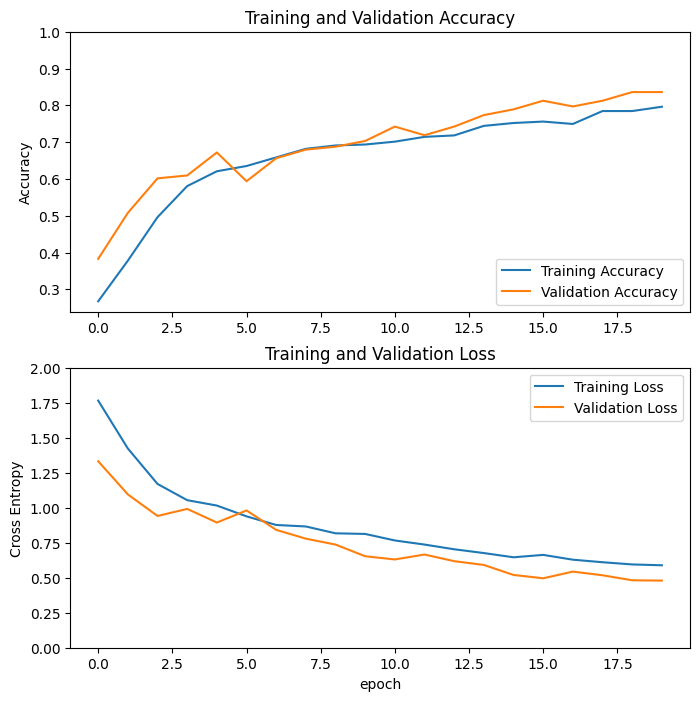

In [34]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,2.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

## Time training

### Sum all of epochs


In [35]:
total_time = sum(time_callback.epoch_times)
print(f"Total time for training: {total_time:.2f} seconds")

Total time for training: 121.93 seconds


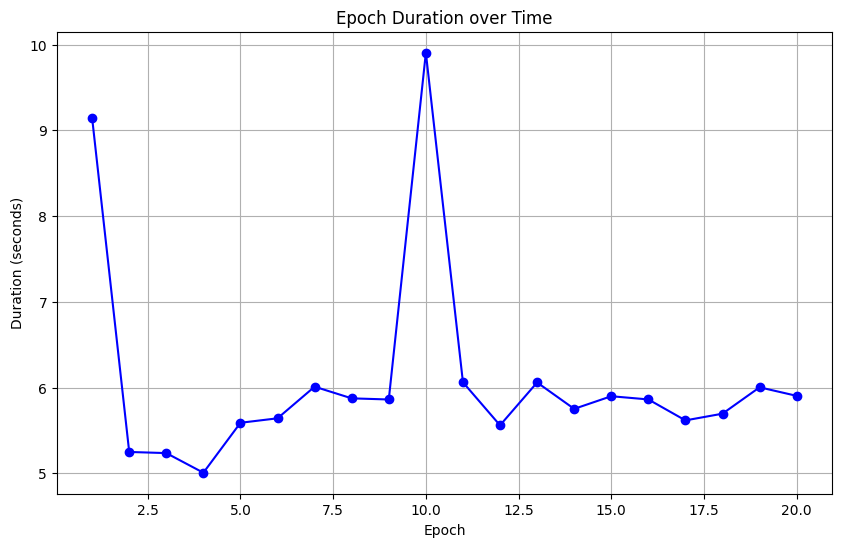

In [36]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(time_callback.epoch_times) + 1), time_callback.epoch_times, marker='o', color='b')
plt.title('Epoch Duration over Time')
plt.xlabel('Epoch')
plt.ylabel('Duration (seconds)')
plt.grid(True)
plt.show()

In [37]:
# E

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - accuracy: 0.8281 - loss: 0.5706
Test loss: 0.5706366300582886
Test accuracy: 0.828125
Predicted classes:
 [2 2 2 2 1 2 0 2 2 2 2 2 2 2 2 2 0 2 2 2 2 2 2 1 2 2 0 2 3 2 2 0 2 2 2 2 2
 2 2 0 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 1 1 0 2 2 2 2 2 0]
True classes:
 [1 2 2 0 1 0 0 2 2 2 2 2 2 2 3 2 0 2 2 2 2 2 2 1 0 2 0 0 1 2 2 0 2 2 2 2 2
 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 0 1 1 3 2 2 2 2 0 0]


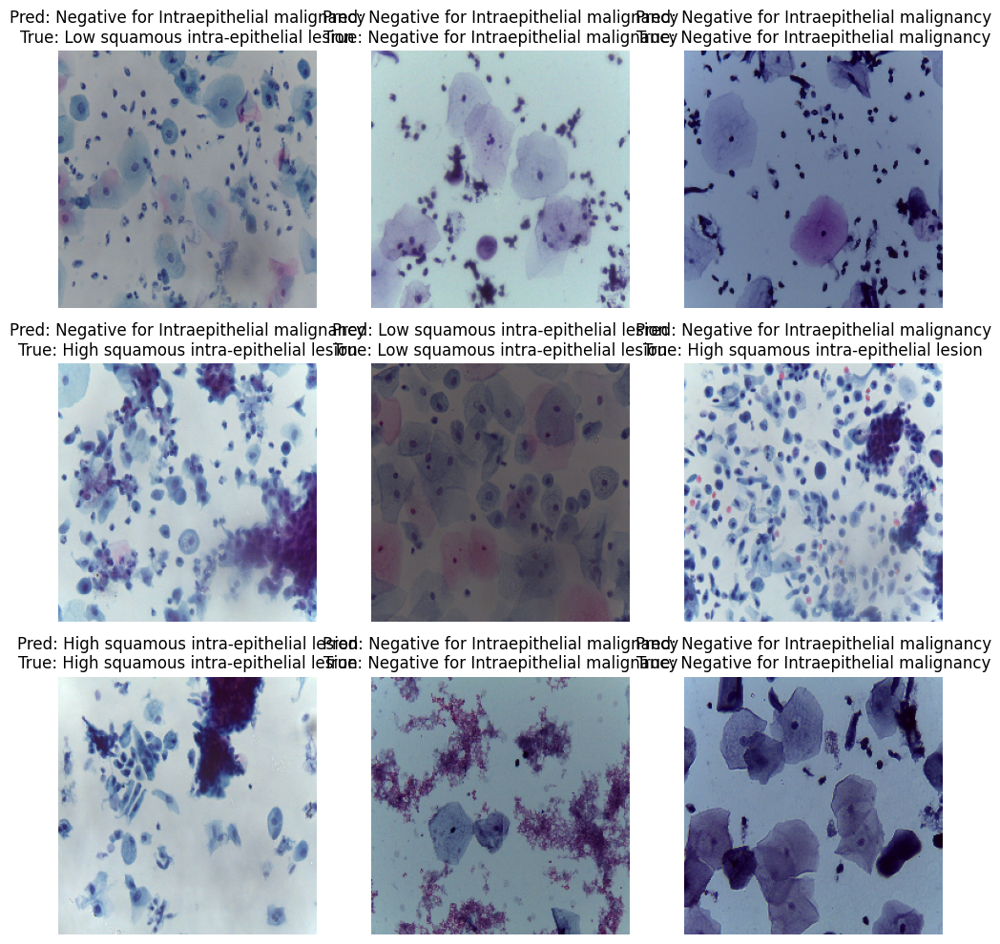

In [38]:
# Đánh giá trên tập test
loss, accuracy = model.evaluate(test_dataset)
print('Test loss:', loss)
print('Test accuracy:', accuracy)

# Lấy một batch ảnh từ tập test
image_batch, label_batch = test_dataset.as_numpy_iterator().next()

# Dự đoán trên batch này
predictions = model.predict_on_batch(image_batch)

# Lấy chỉ số lớp dự đoán cao nhất
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(label_batch, axis=1)

# In ra kết quả dự đoán và nhãn thật
print('Predicted classes:\n', predicted_classes)
print('True classes:\n', true_classes)

# Hiển thị hình ảnh với dự đoán
plt.figure(figsize=(10, 10))
for i in range(9):  # Hiển thị 9 ảnh đầu tiên
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image_batch[i].astype("uint8"))
    plt.title(f"Pred: {class_names[predicted_classes[i]]}\nTrue: {class_names[true_classes[i]]}")
    plt.axis("off")
plt.tight_layout()
plt.show()
